In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='IPython.core.pylabtools')

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
sample_size = 20000

# Data Loading and Cleaning

In [3]:
# load pre-aggregation features
pre_agg = pd.read_csv(f'../results/pre-aggregation/liwcANDfeatures_results_{sample_size}.csv.gzip', compression='gzip')
pre_agg['final_message_string'] = pre_agg['final_message_string'].astype(str)

In [4]:
#assign sentiment column
pre_agg['sentiment'] = np.where(pre_agg['positive_sentiment'] == 1, 'positive', np.where(pre_agg['negative_sentiment'] == 1, 'negative', 'neutral'))

In [5]:
# load aggregated per author df
post_agg_author = pd.read_csv(f'../results/post-aggregation/author_{sample_size}.csv.gzip', compression='gzip')
#only keep rows of post_agg_author where own_message + forwarded_message is 1
post_agg_author = post_agg_author[post_agg_author['own_message'] + post_agg_author['forwarded_message'] == 1]

In [6]:
#load aggregated per author and date df
author_date = pd.read_csv(f'../results/post-aggregation/author_date_{sample_size}.csv.gzip', compression='gzip')
author_date['date'] = pd.to_datetime(author_date['date'])

In [7]:
# load aggregated per author and group df
author_group = pd.read_csv(f'../results/post-aggregation/author_group_{sample_size}.csv.gzip', compression='gzip')
# otherwise plt doesn't recognize unique values
author_group['group_name'] = author_group['group_name'].str.strip().str.lower()

In [8]:
#put all features to be plotted in one list
features = post_agg_author.columns[1:-10].append(post_agg_author.columns[-8:-6].append(post_agg_author.columns[-5:-1]))
features

Index(['noun_count', 'verb_count', 'adj_count', 'positive_sentiment',
       'negative_sentiment', 'neutral_sentiment', 'channel_messages',
       'group_messages', 'sent_count', 'word_count', 'avg_sent_length',
       'avg_word_length', 'exclamation_count', 'question_count', 'emoji_count',
       'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other',
       'liwc_Affect', 'own_message', 'forwarded_message', 'own_message_count',
       'forwarded_message_count', 'action_quotient', 'sentiment_quotient'],
      dtype='object')

# Post-Aggregation Features over Time

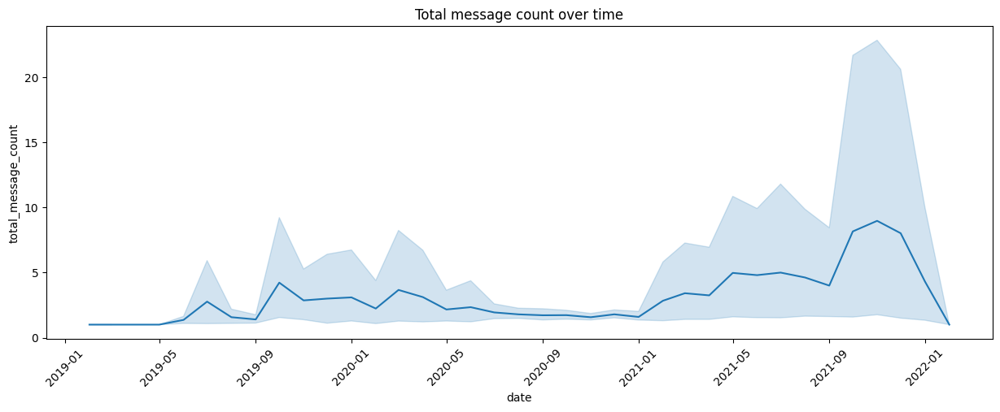

In [9]:
# message counts
plt.figure(figsize=(15, 5))
sns.lineplot(data=author_date, x='date', y='total_message_count', sort=True)
plt.xticks(rotation=45)
plt.title(f'Total message count over time')
plt.show()

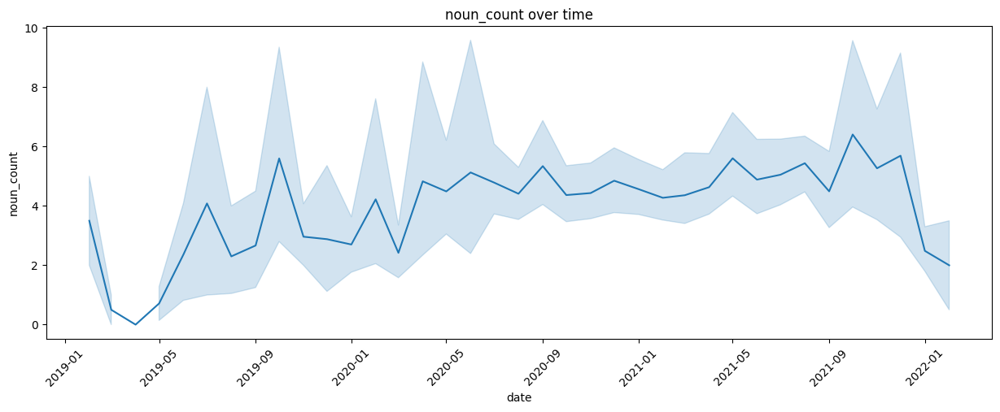

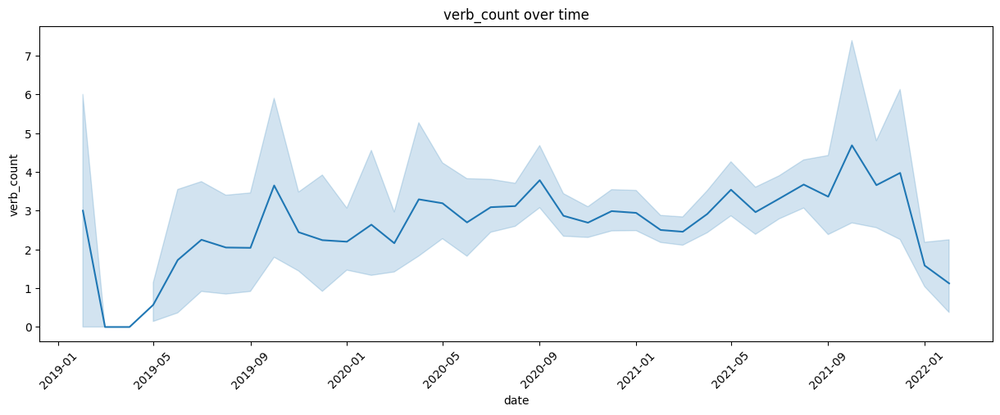

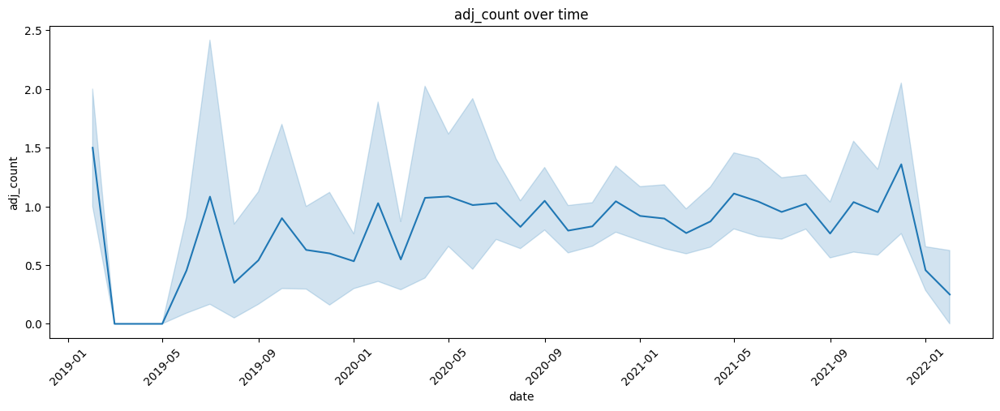

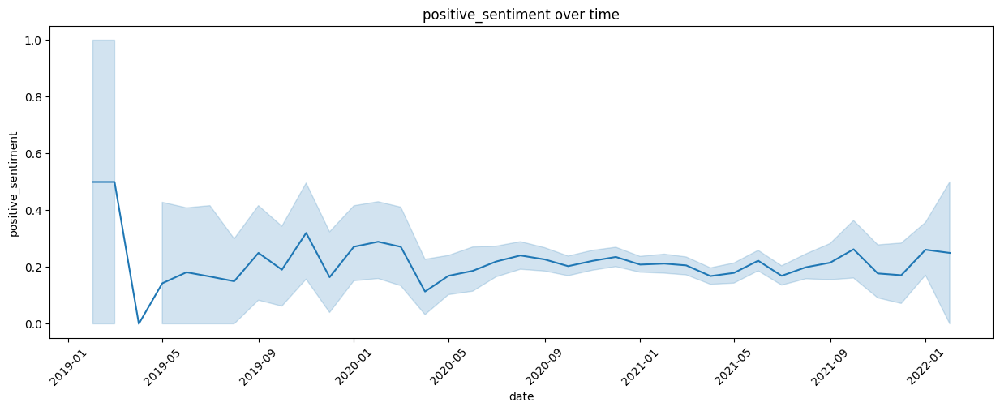

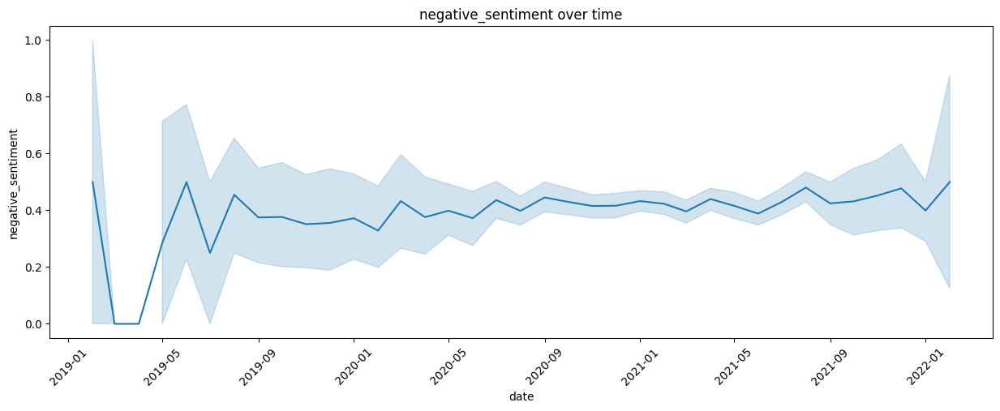

...

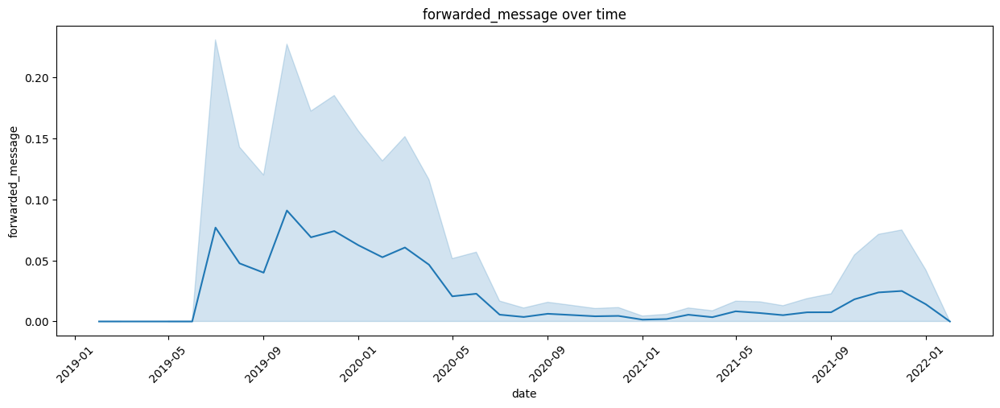

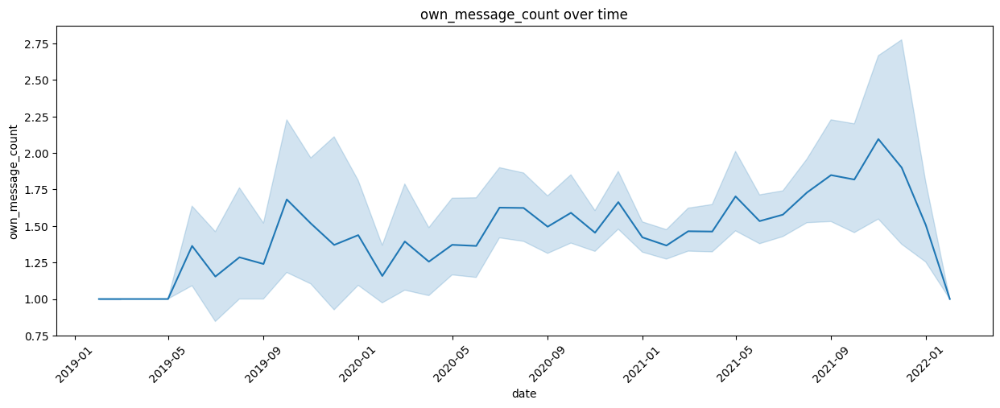

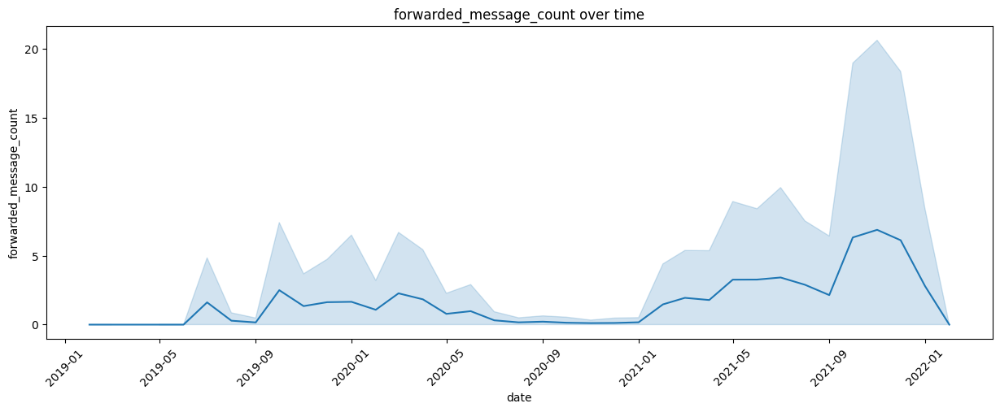

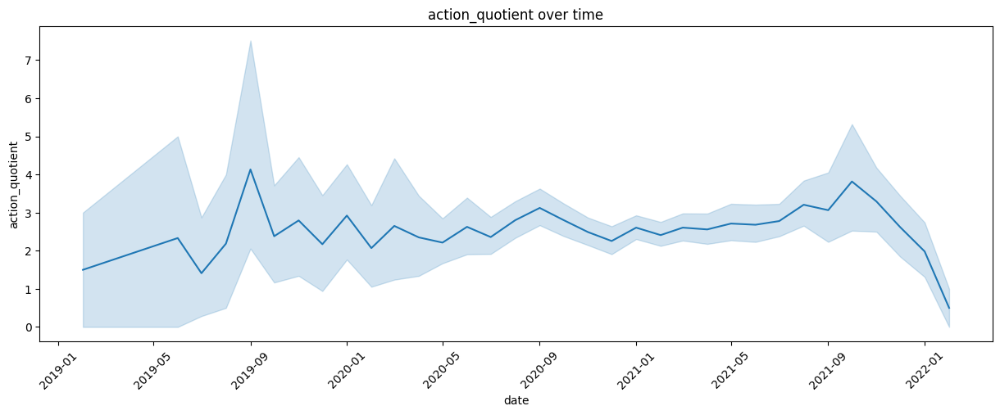

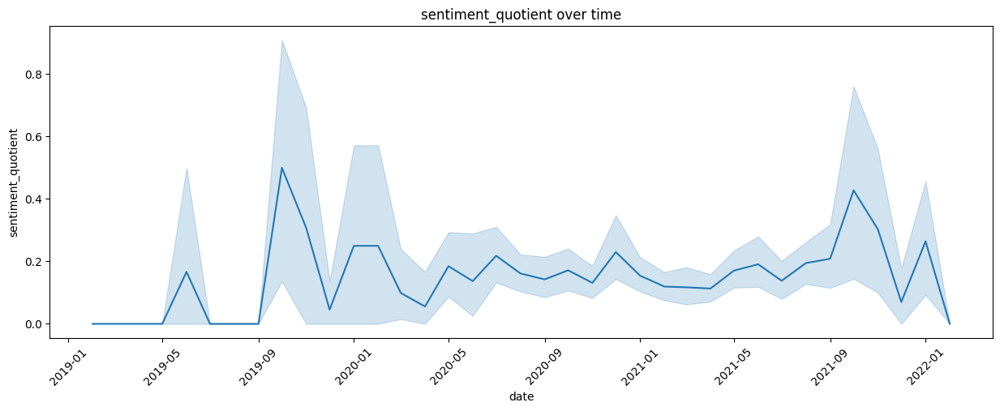

In [10]:
# avg of all features over time
for col in features:
    plt.figure(figsize=(15, 5))
    sns.lineplot(data=author_date, x='date', y=col, sort=True)
    plt.xticks(rotation=45)
    plt.title(f'{col} over time')
    plt.show()

# Post-Aggregation Features per Group

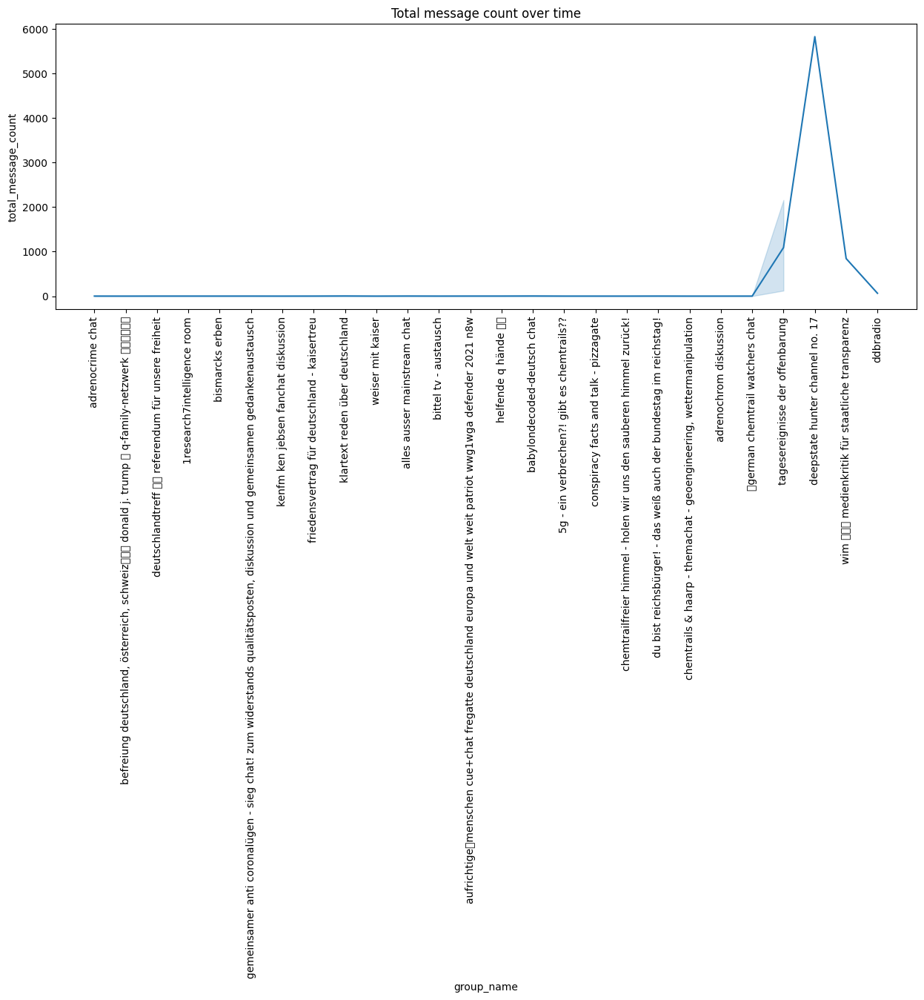

In [11]:
# message counts
plt.figure(figsize=(15, 5))
sns.lineplot(data=author_group, x='group_name', y='total_message_count', sort=True)
plt.xticks(rotation=90)
plt.title(f'Total message count over time')
plt.show()

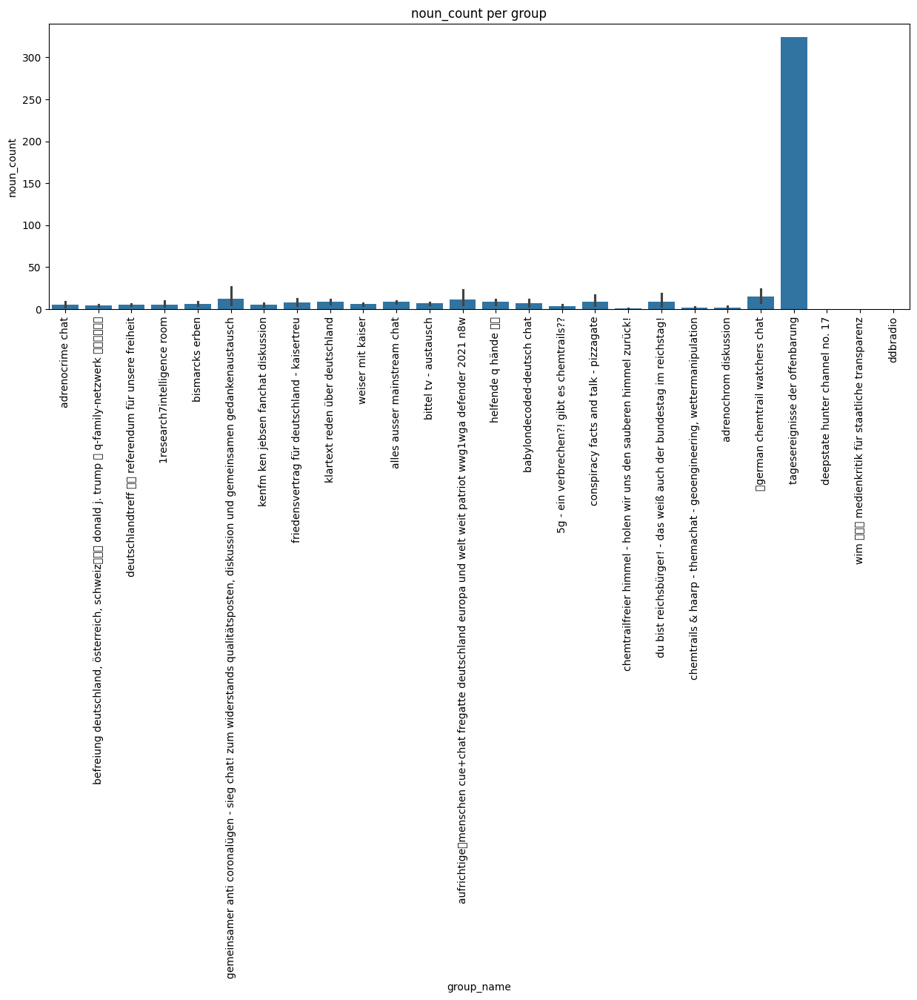

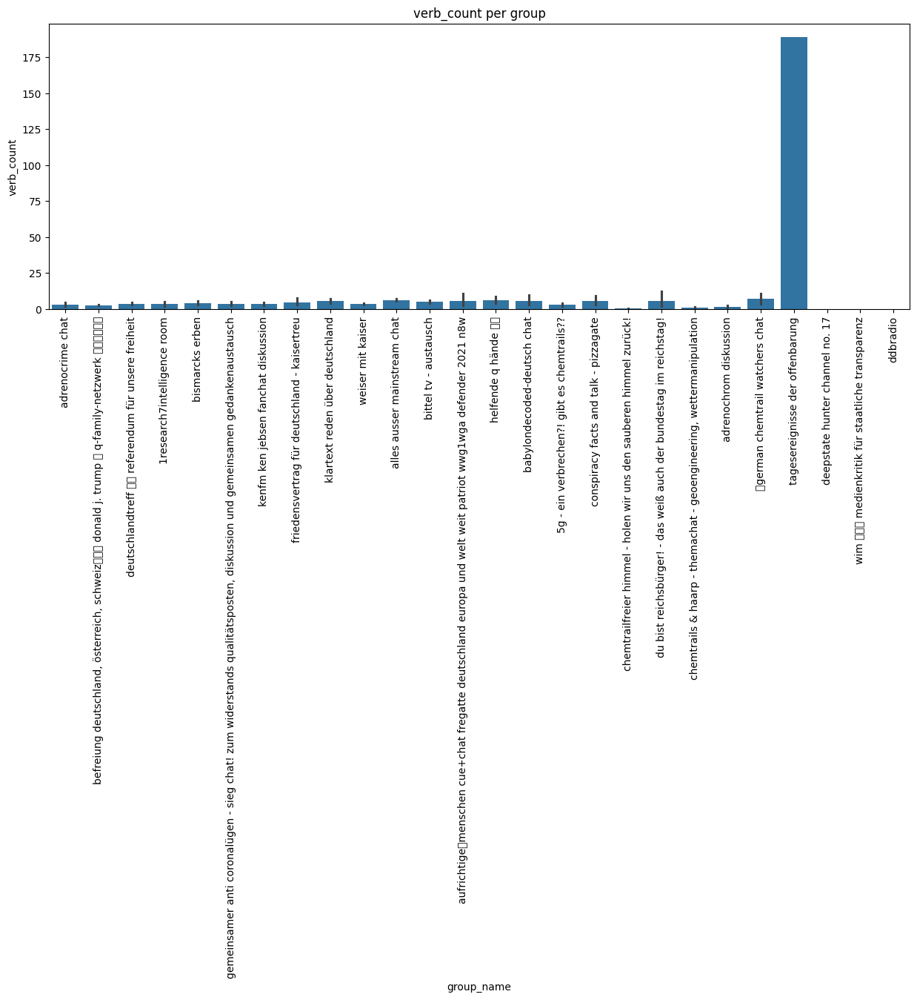

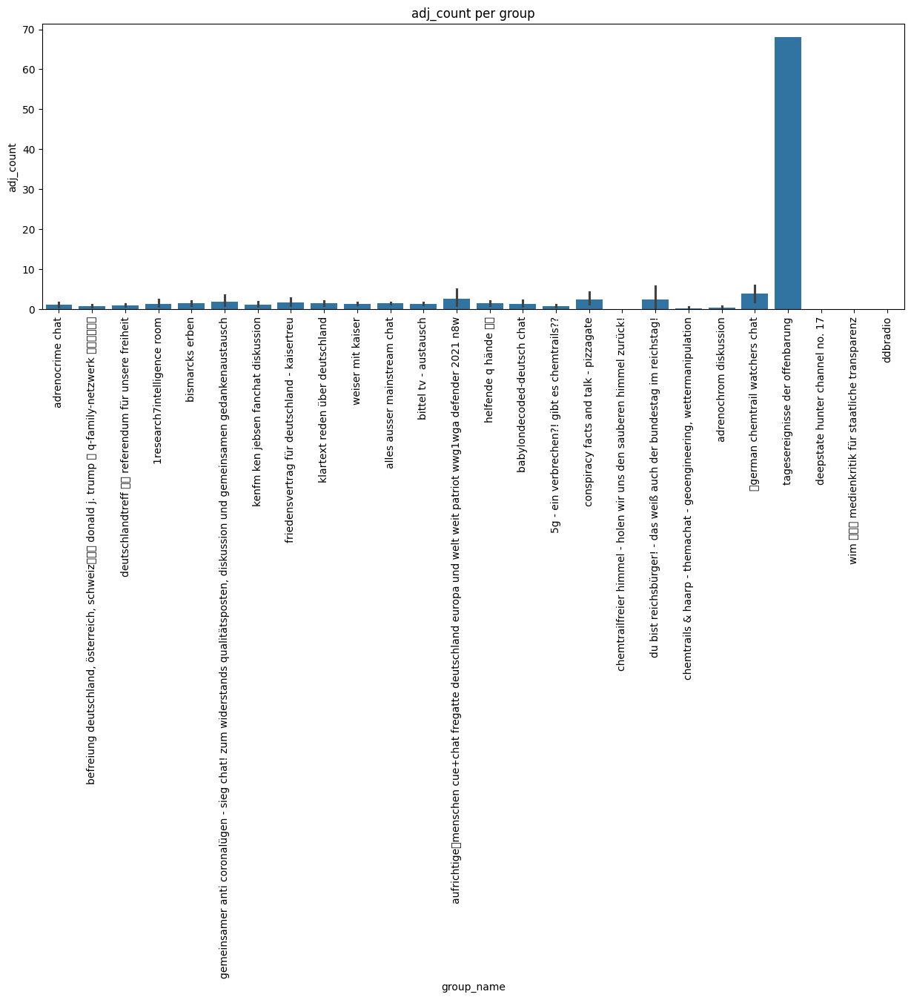

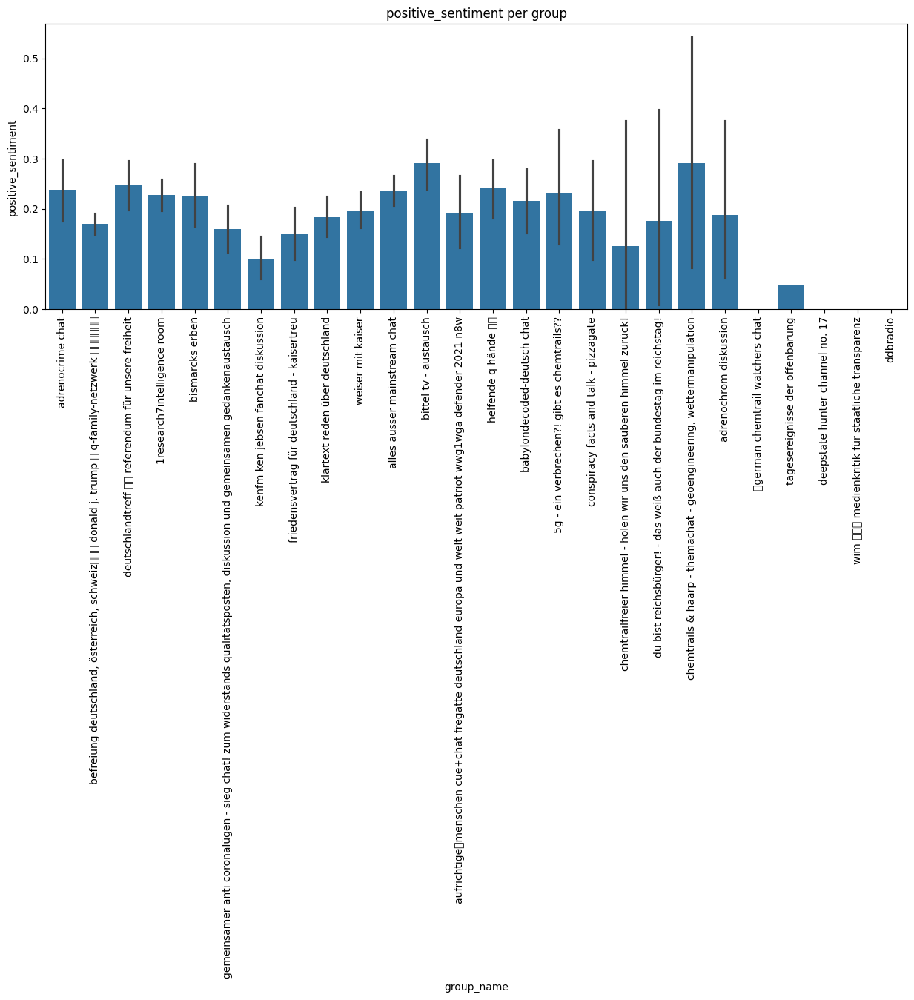

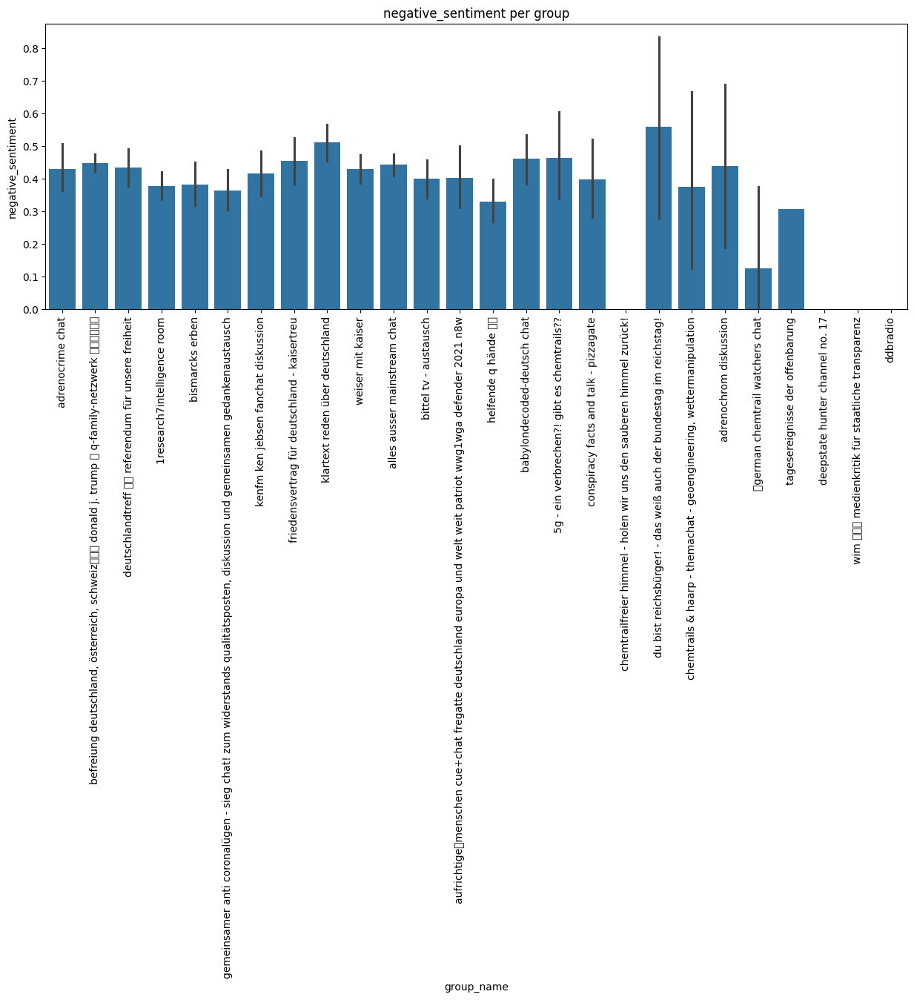

...

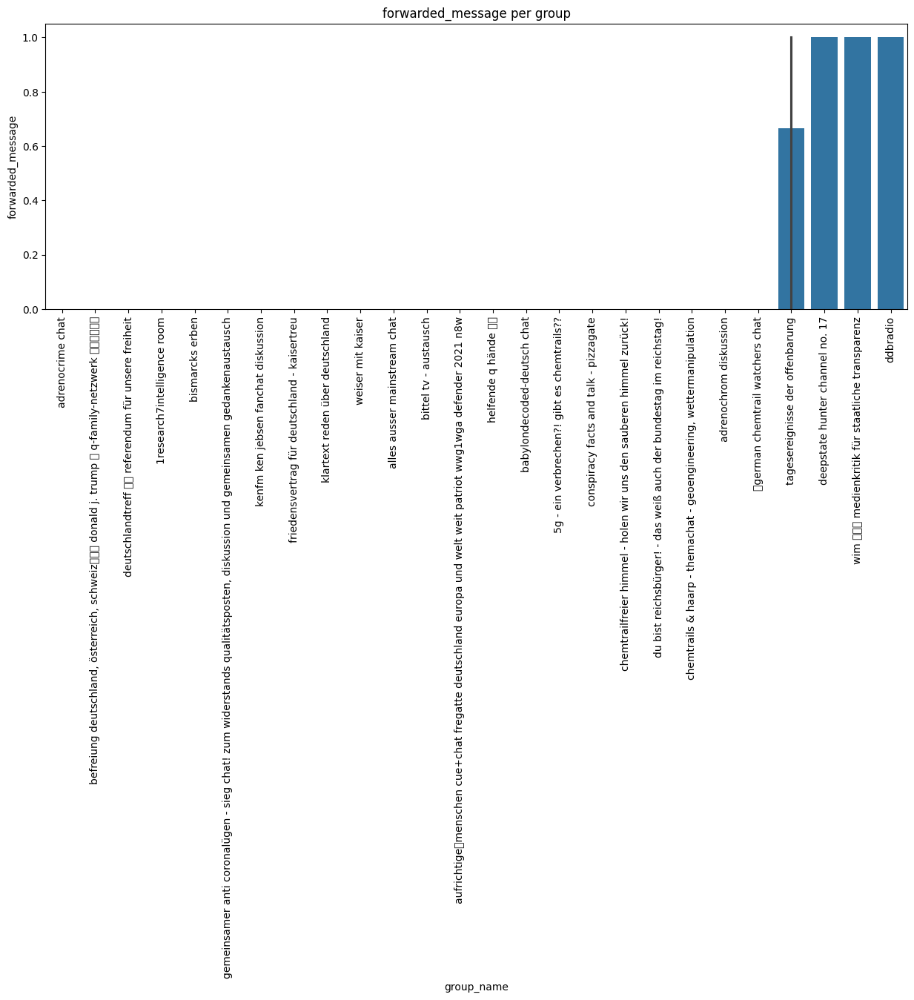

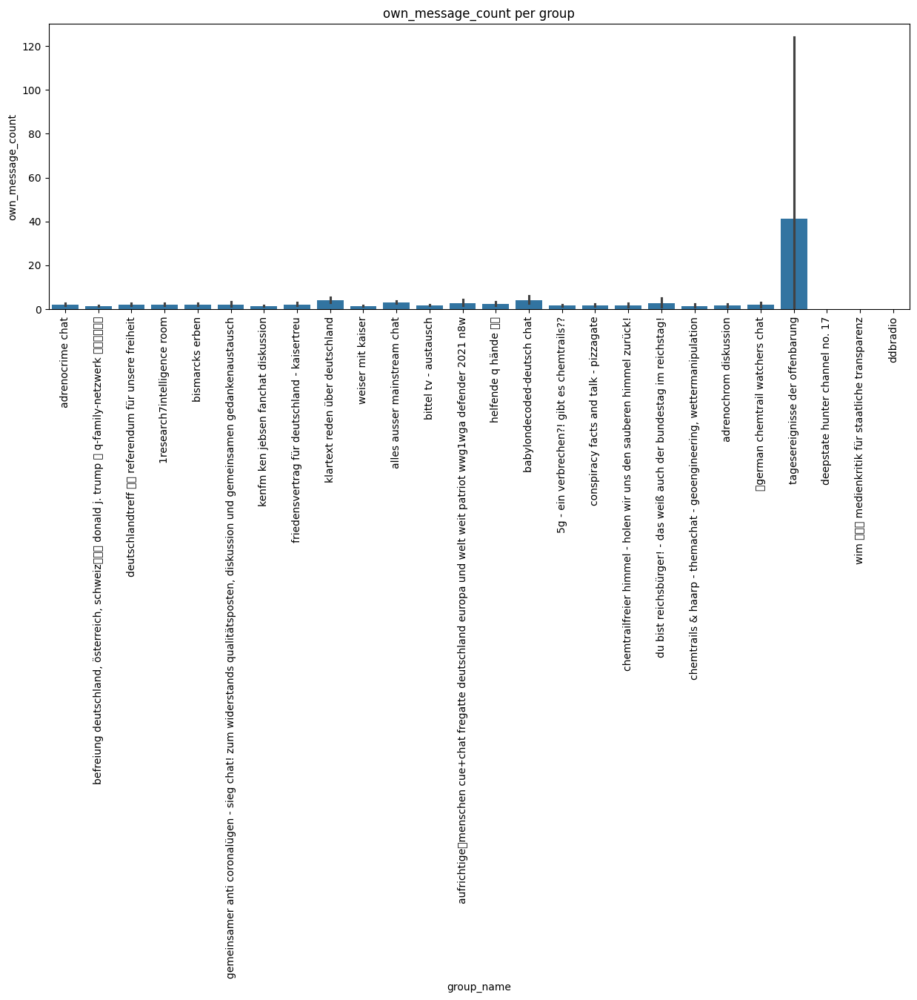

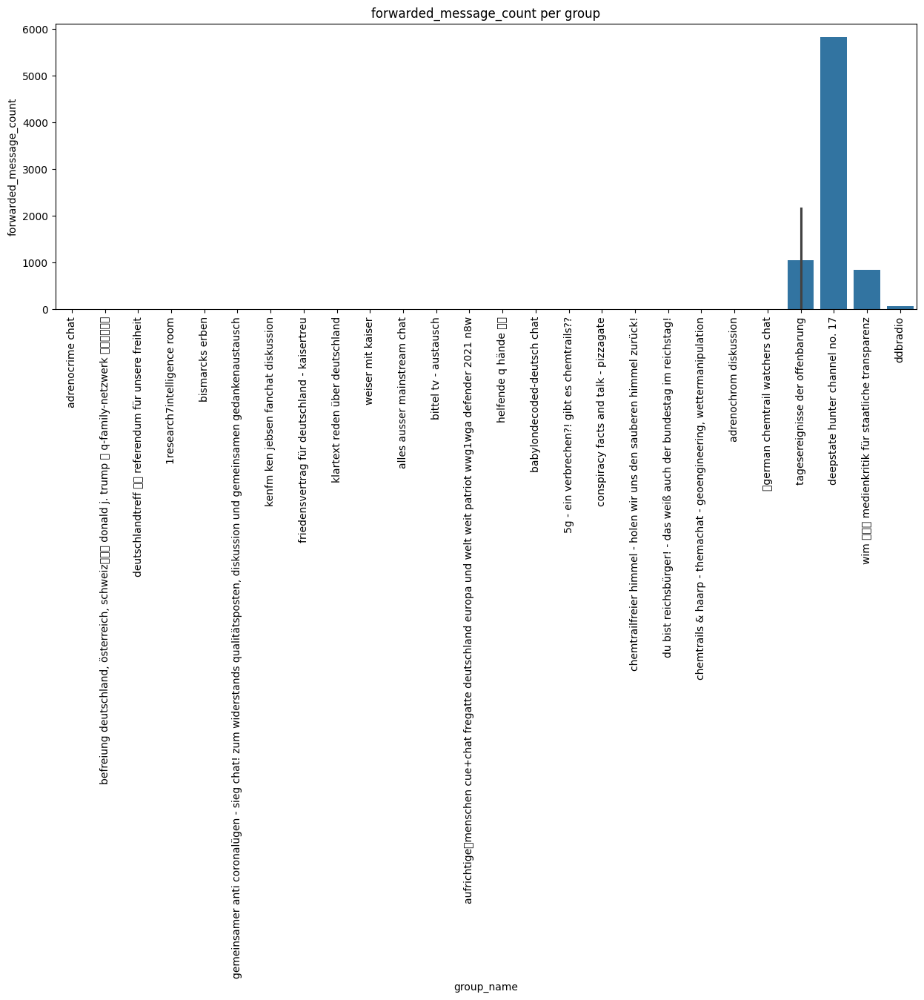

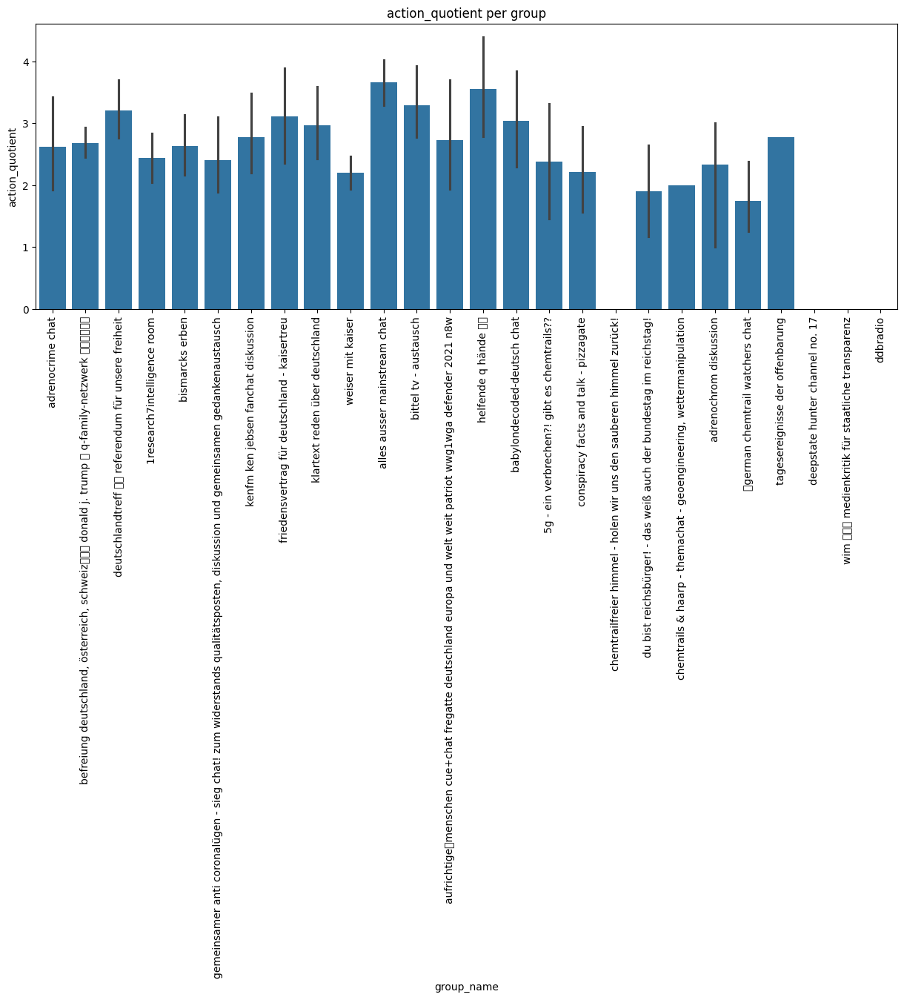

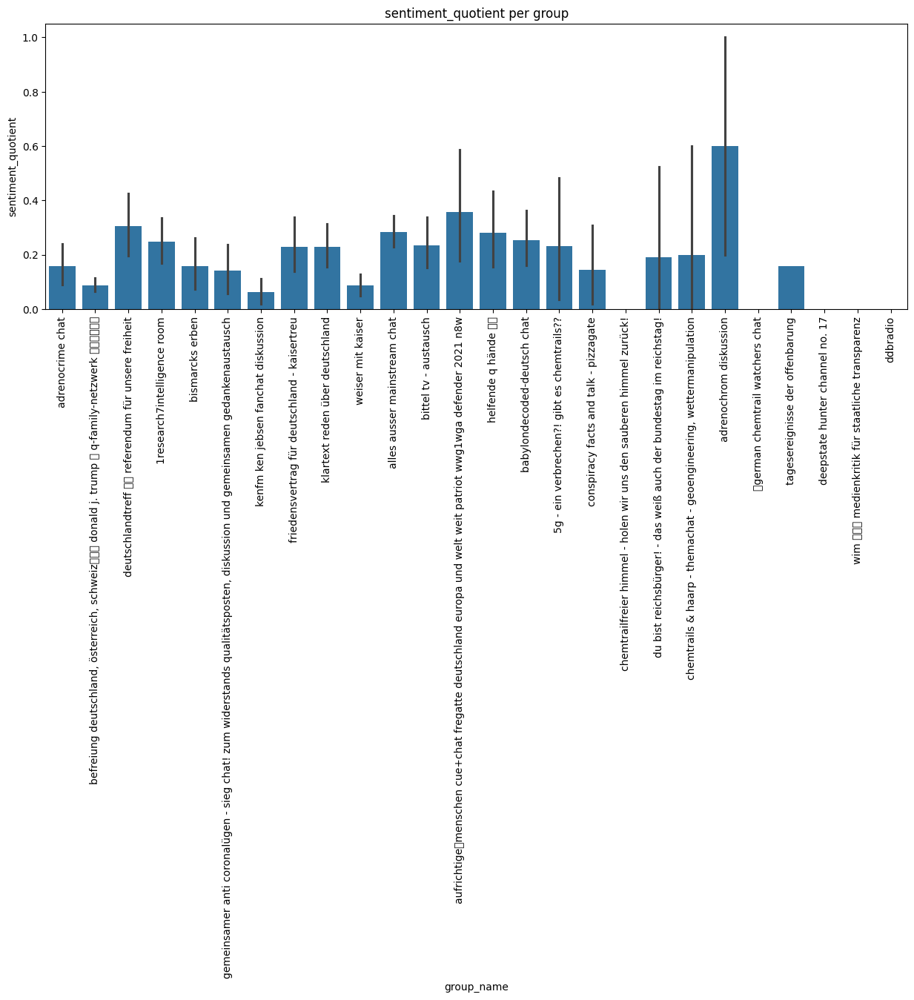

In [12]:
#plot avg of columns per group
for col in features:
    plt.figure(figsize=(15, 5))
    sns.barplot(data=author_group, x='group_name', y=col)
    plt.xticks(rotation=90)
    plt.title(f'{col} per group')
    plt.show()

# Channel vs. Group Messages

In [13]:
pre_agg.columns

Index(['UID_key', 'author', 'fwd_message', 'date', 'group_or_channel',
       'own_message', 'forwarded_message', 'group_name', 'fwd_message_string',
       'final_message', 'final_message_string', 'sent_count', 'word_count',
       'avg_sent_length', 'avg_word_length', 'exclamation_count',
       'question_count', 'emoji_count', 'noun_count', 'verb_count',
       'adj_count', 'flesch_reading_ease', 'flesch_reading_ease_class',
       'positive_sentiment', 'negative_sentiment', 'neutral_sentiment',
       'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other', 'liwc_Affect',
       'sentiment'],
      dtype='object')

In [14]:
pre_features = pre_agg.columns[5:7].append(pre_agg.columns[11:22].append(pre_agg.columns[26:]))
pre_features

Index(['own_message', 'forwarded_message', 'sent_count', 'word_count',
       'avg_sent_length', 'avg_word_length', 'exclamation_count',
       'question_count', 'emoji_count', 'noun_count', 'verb_count',
       'adj_count', 'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You',
       'liwc_Other', 'liwc_Affect', 'sentiment'],
      dtype='object')

In [10]:
plotting = pre_agg[pre_agg['own_message'] == 1]

## KDE

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_3094/3328825641.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(channels[col], label='Channel', fill=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_3094/3328825641.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(groups[col], label='Group', fill=True)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


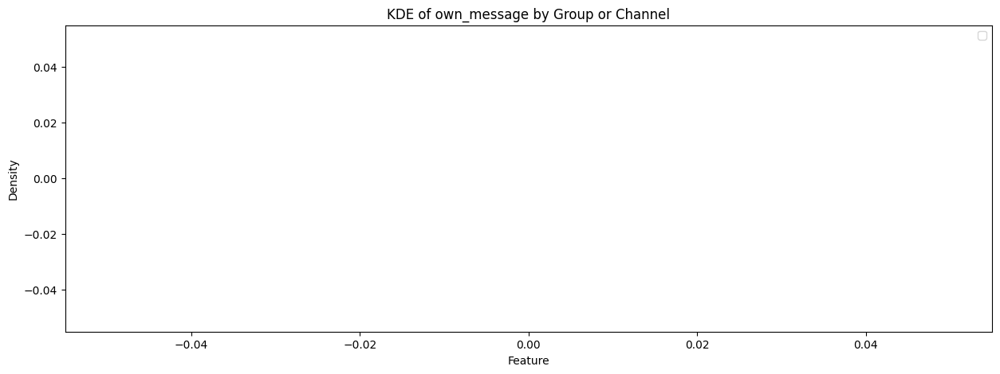

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_3094/3328825641.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(channels[col], label='Channel', fill=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_3094/3328825641.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(groups[col], label='Group', fill=True)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


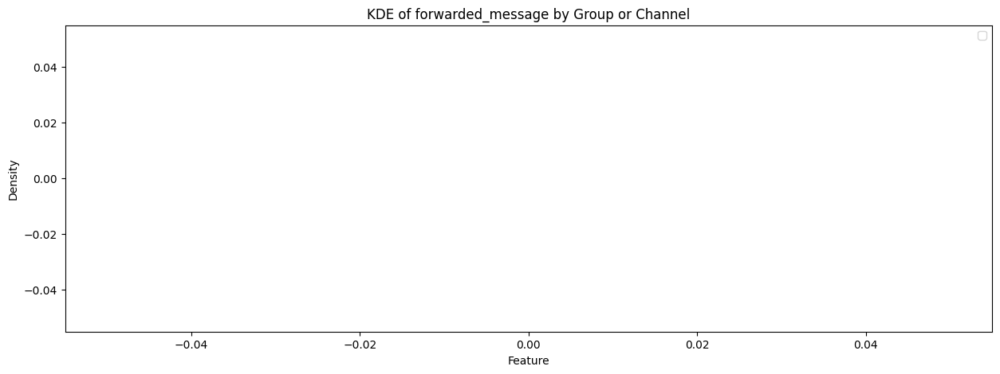

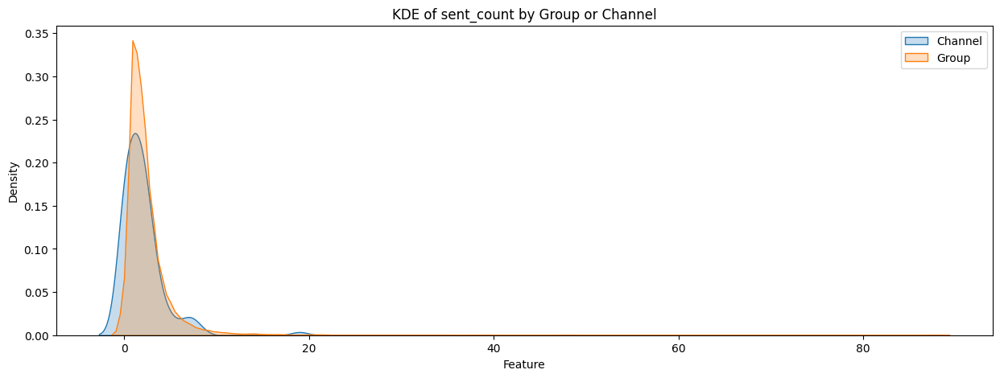

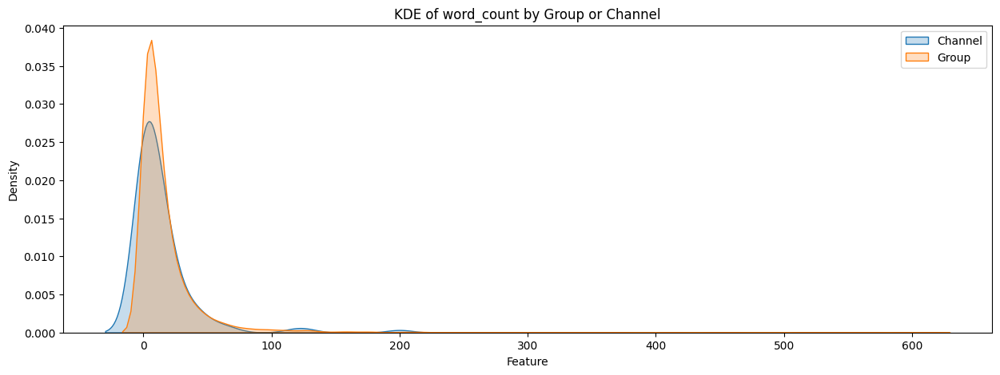

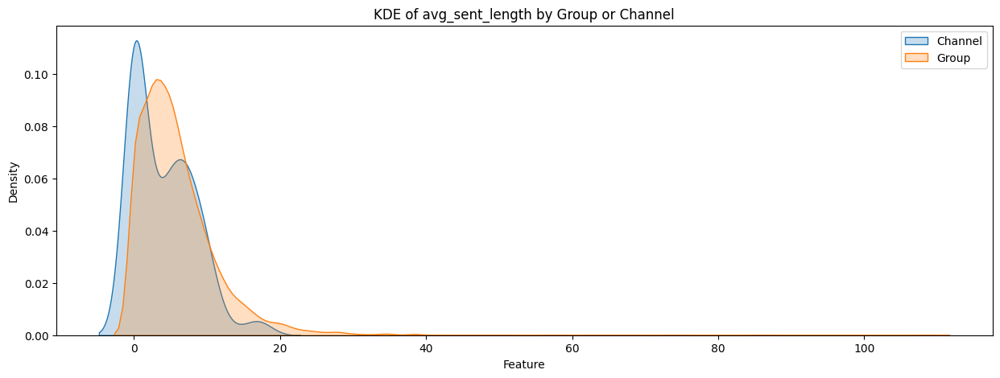

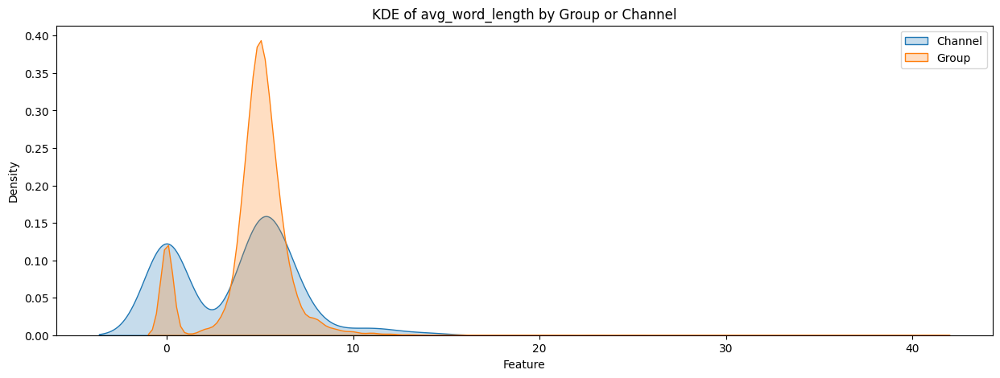

...

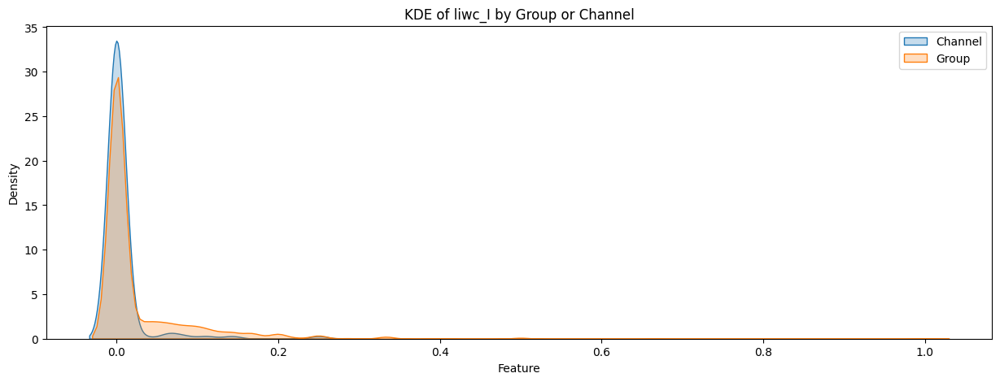

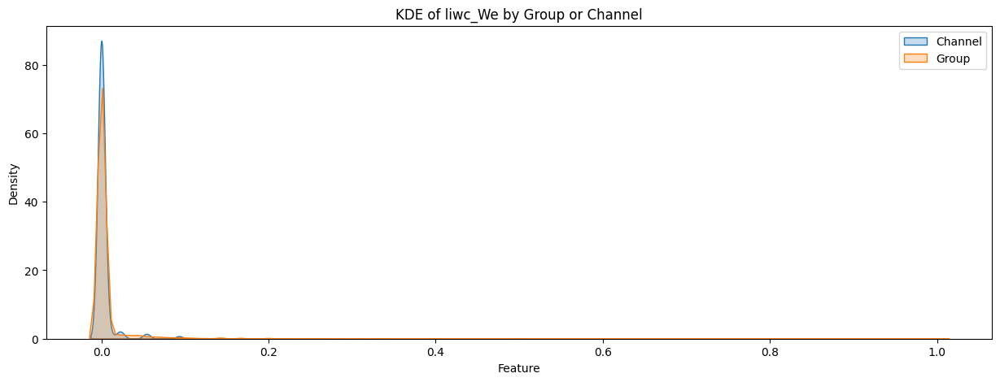

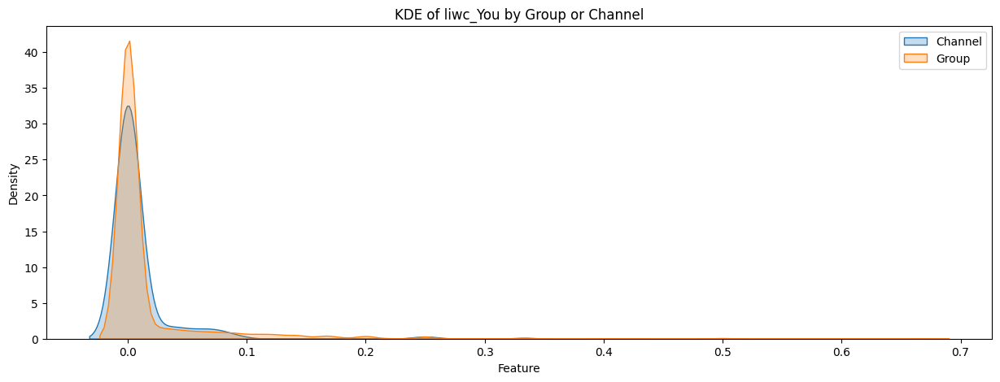

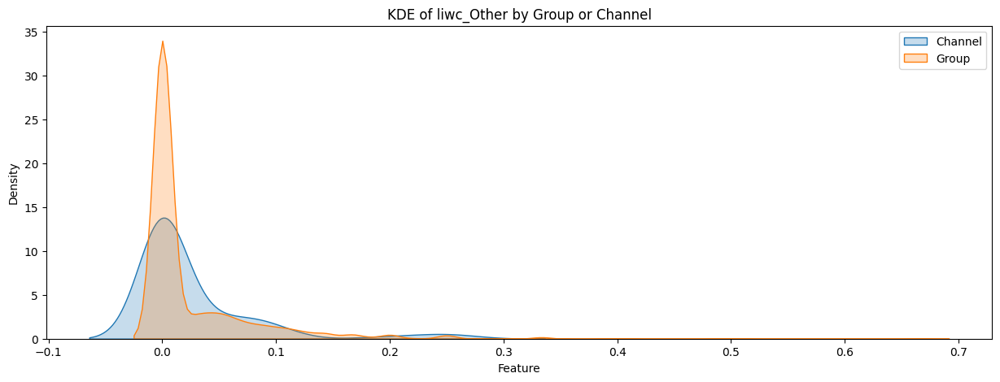

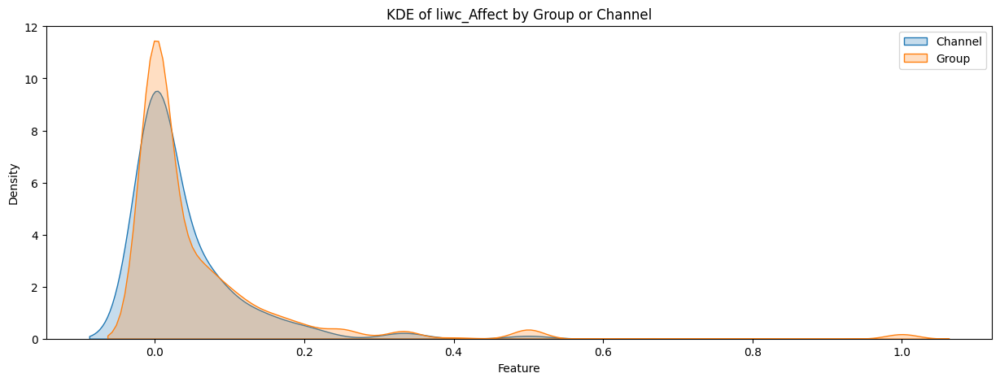

In [16]:
channels = plotting[plotting['group_or_channel'] == 'channel']
groups = plotting[plotting['group_or_channel'] == 'group']

#plot KDEs
for col in pre_features[:-1]:
    plt.figure(figsize=(15, 5))
    sns.kdeplot(channels[col], label='Channel', fill=True)
    sns.kdeplot(groups[col], label='Group', fill=True)
    plt.xlabel('Feature')
    plt.ylabel('Density')
    plt.title(f'KDE of {col} by Group or Channel')
    if col == 'flesch_reading_ease':
        plt.xlim(0,100)
    plt.legend()
    plt.show()

## Categorial Variables

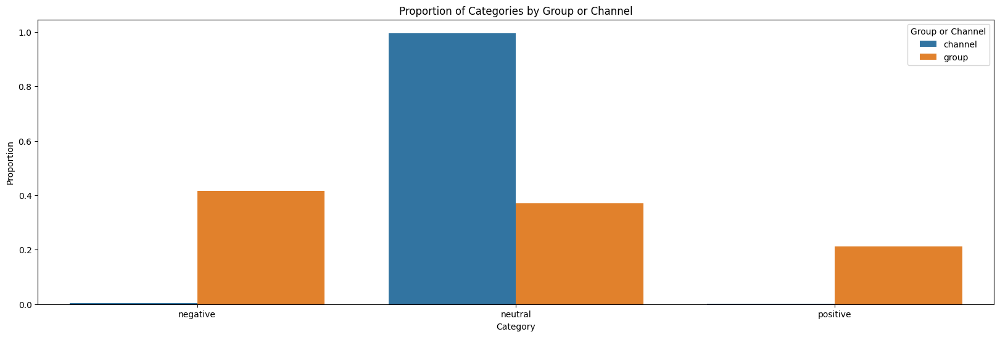

In [17]:
# Calculate proportions
prop_sent = pre_agg.groupby(['group_or_channel', 'sentiment']).size().reset_index(name='count')
prop_sent['proportion'] = prop_sent.groupby('group_or_channel')['count'].transform(lambda x: x / x.sum())

# Plotting the proportions
plt.figure(figsize=(20, 6))
sns.barplot(data=prop_sent, x='sentiment', y='proportion', hue='group_or_channel')
plt.title('Proportion of Categories by Group or Channel')
plt.xlabel('Category')
plt.ylabel('Proportion')
plt.legend(title='Group or Channel')
plt.show()

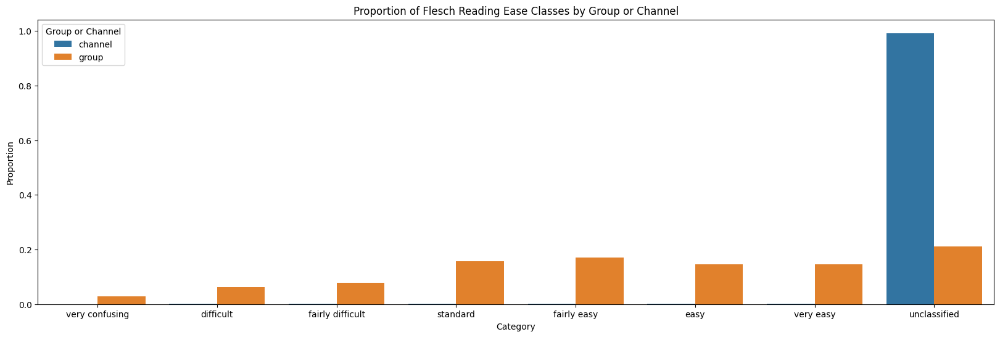

In [18]:
# Calculate proportions
prop_flesch = pre_agg.groupby(['group_or_channel', 'flesch_reading_ease_class']).size().reset_index(name='count')
prop_flesch['proportion'] = prop_flesch.groupby('group_or_channel')['count'].transform(lambda x: x / x.sum())

# ordering classes
label_order = ['very confusing', 'difficult', 'fairly difficult', 'standard', 'fairly easy', 'easy', 'very easy', 'unclassified']
prop_flesch['flesch_reading_ease_class'] = pd.Categorical(prop_flesch['flesch_reading_ease_class'], categories=label_order, ordered=True)

# Plotting the proportions
plt.figure(figsize=(20, 6))
sns.barplot(data=prop_flesch, x='flesch_reading_ease_class', y='proportion', hue='group_or_channel')
plt.title('Proportion of Flesch Reading Ease Classes by Group or Channel')
plt.xlabel('Category')
plt.ylabel('Proportion')
plt.legend(title='Group or Channel')
plt.show()

## Proportions

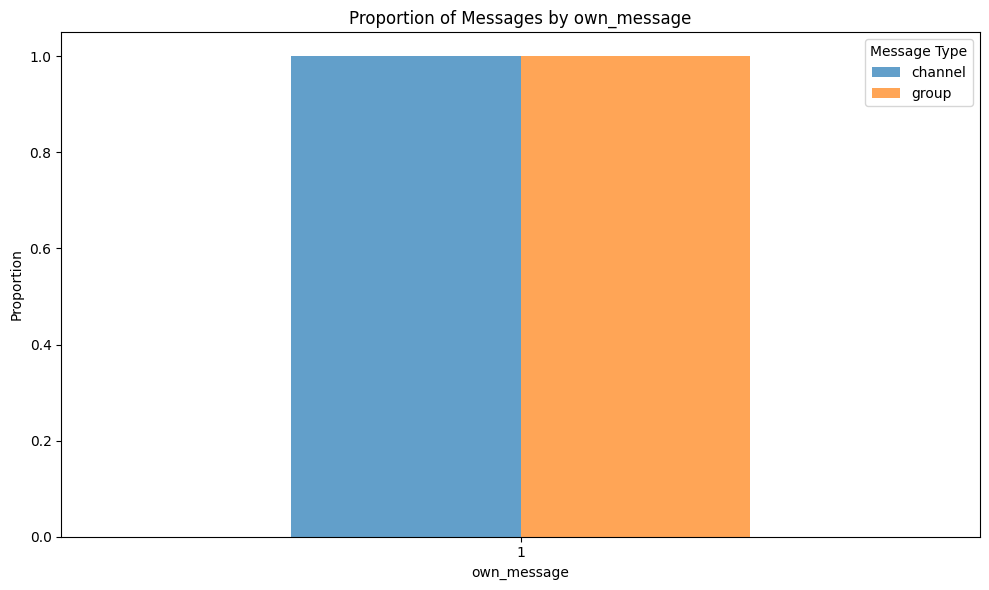

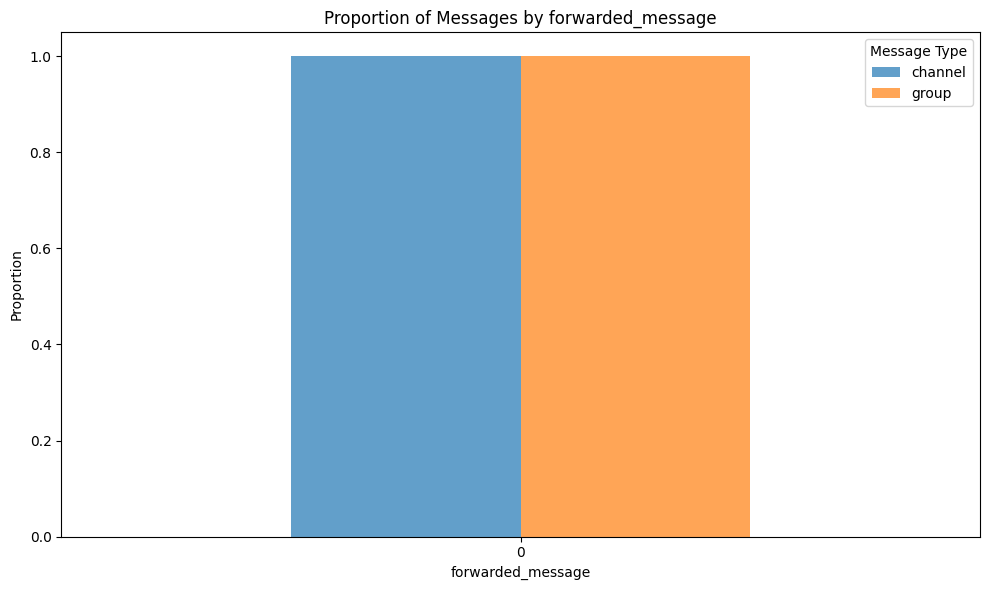

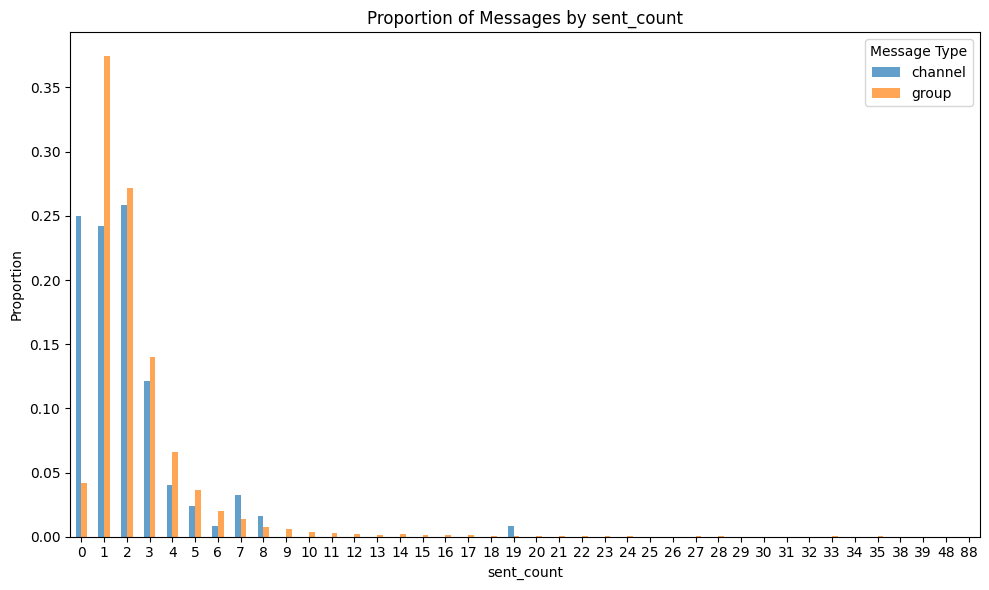

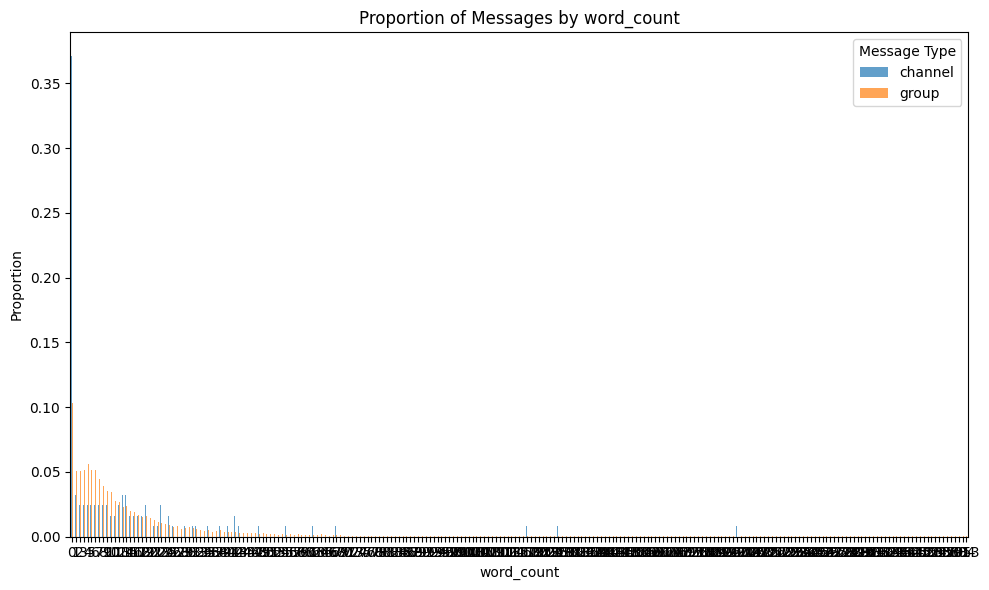

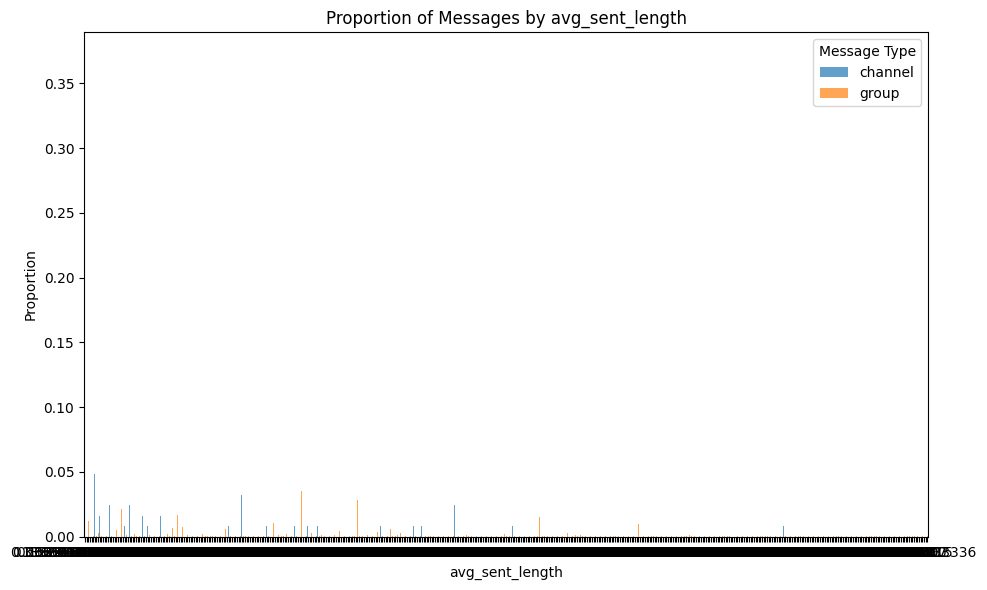

...

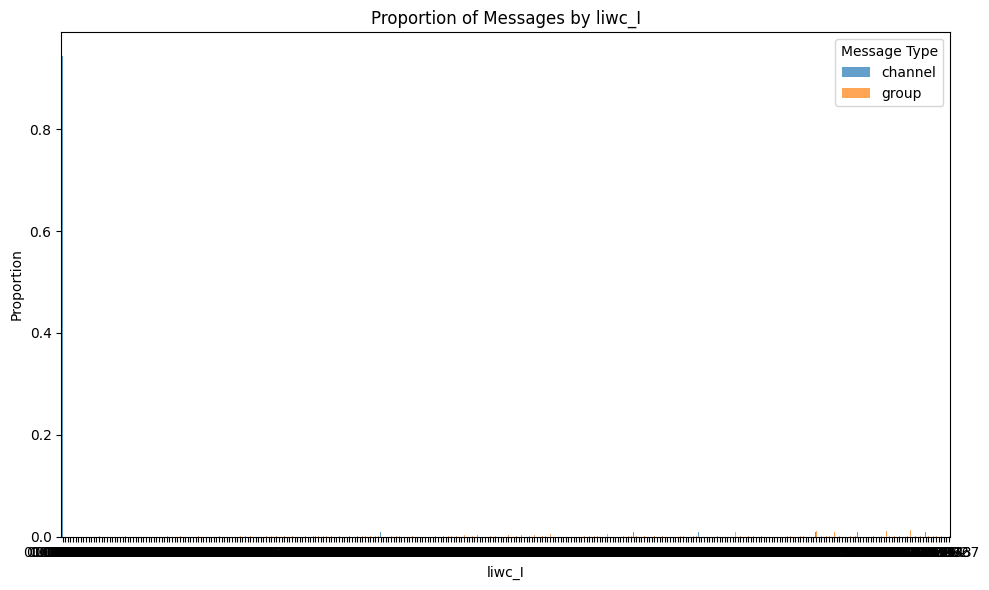

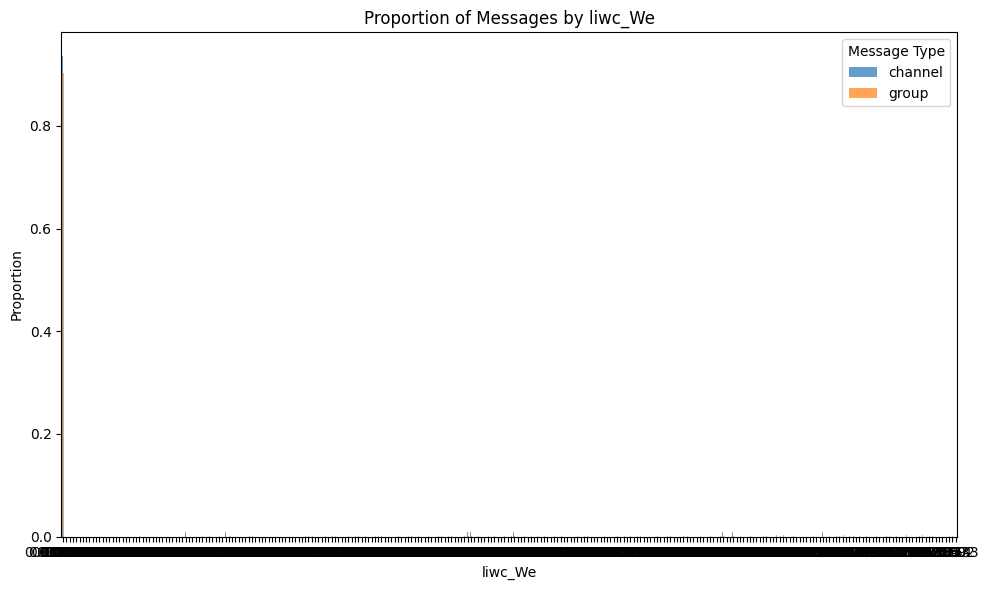

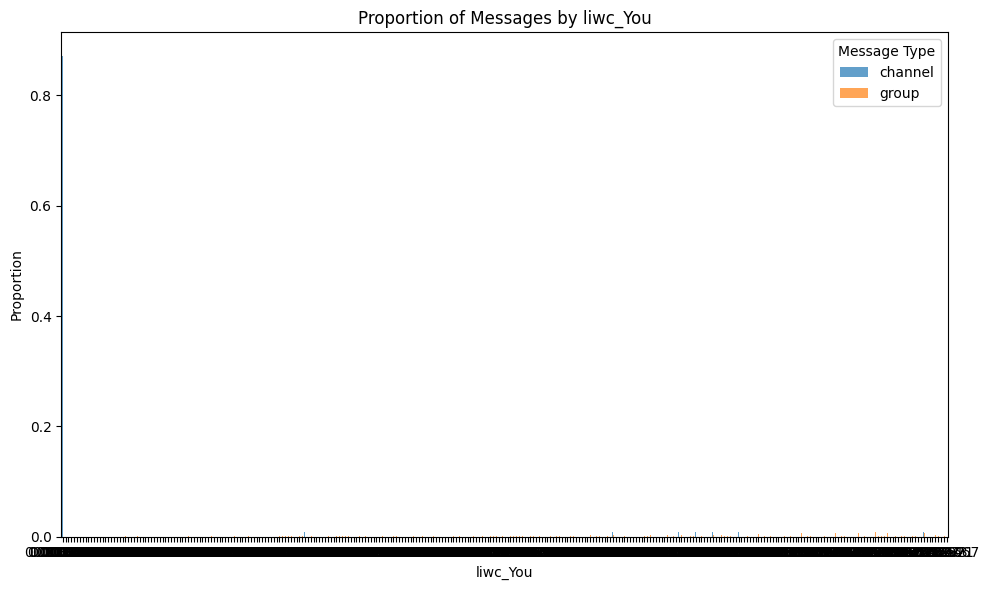

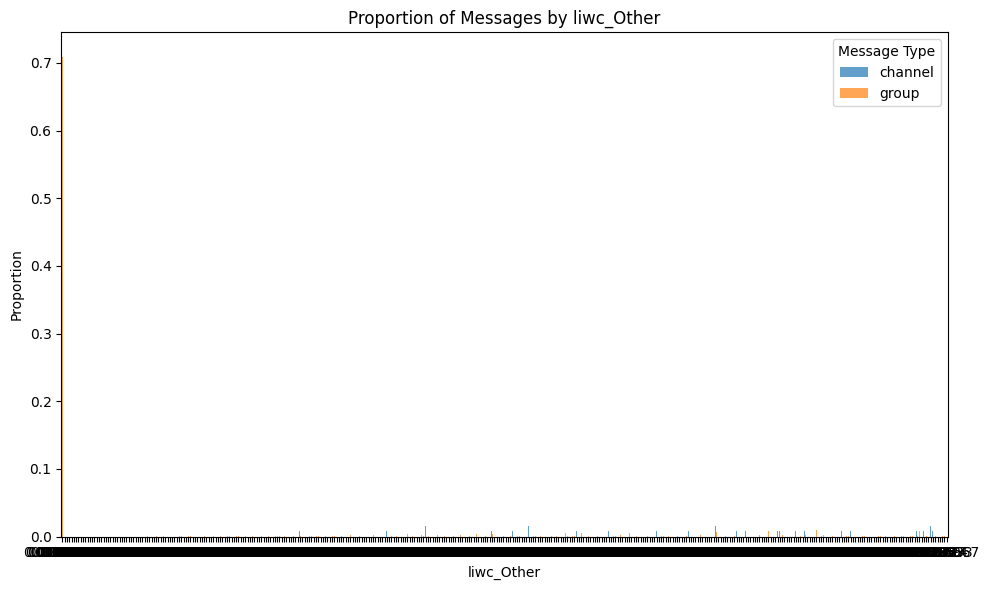

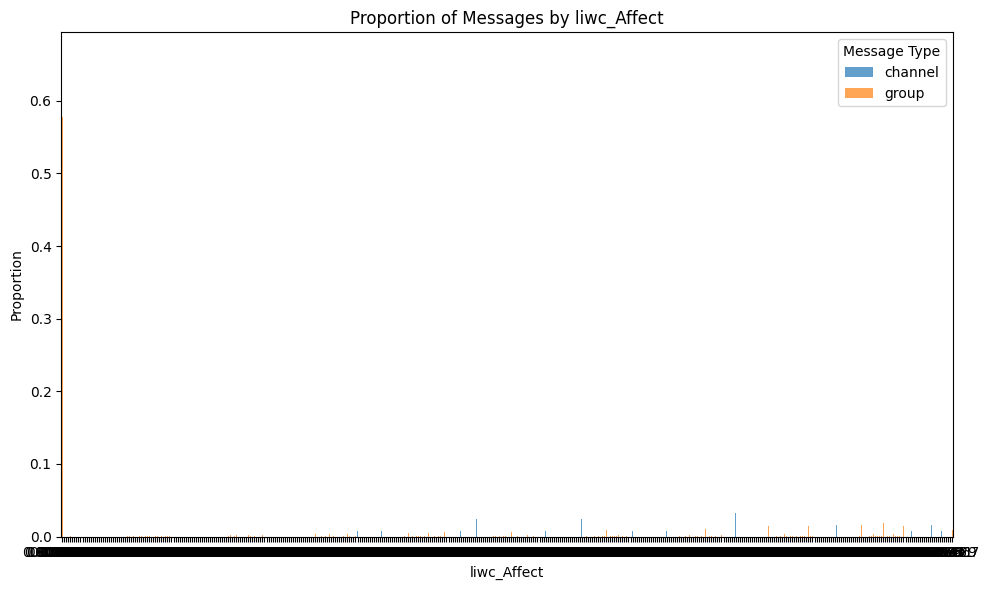

In [19]:
def plot_proportions(df, feature):
    proportions = df.groupby(['group_or_channel', feature]).size().unstack(fill_value=0)
    proportions = proportions.div(proportions.sum(axis=1), axis=0)
    proportions.T.plot(kind='bar', figsize=(10, 6), alpha=0.7)
    plt.title(f'Proportion of Messages by {feature}')
    plt.xlabel(feature)
    plt.ylabel('Proportion')
    plt.xticks(rotation=0)
    plt.legend(title='Message Type')
    plt.tight_layout()
    plt.show()

# Plot proportions for each feature
for feature in pre_features[:-1]:
    plot_proportions(plotting, feature)

## Selected Features

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_4901/3302940331.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  flesch_plot['flesch_reading_ease_class'] = pd.Categorical(flesch_plot['flesch_reading_ease_class'], categories=label_order[:-1], ordered=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_4901/3302940331.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  flesch_plot = flesch_plot.groupby(['group_or_channel', 'flesch_reading_ease_class']).size().unstack(fill_value=0)


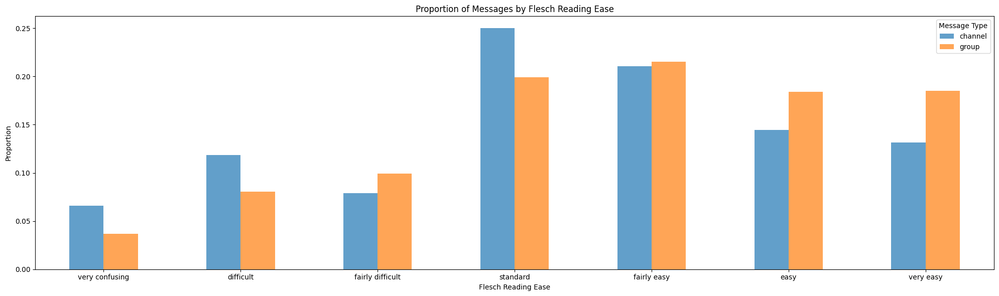

In [12]:
# plot only flesch reading ease
label_order = ['very confusing', 'difficult', 'fairly difficult', 'standard', 'fairly easy', 'easy', 'very easy', 'unclassified']
flesch_plot = plotting[plotting['flesch_reading_ease_class'] != 'unclassified']
flesch_plot['flesch_reading_ease_class'] = pd.Categorical(flesch_plot['flesch_reading_ease_class'], categories=label_order[:-1], ordered=True)
flesch_plot = flesch_plot.groupby(['group_or_channel', 'flesch_reading_ease_class']).size().unstack(fill_value=0)
flesch_plot = flesch_plot.div(flesch_plot.sum(axis=1), axis=0)
flesch_plot.T.plot(kind='bar', figsize=(20, 6), alpha=0.7)
plt.title('Proportion of Messages by Flesch Reading Ease')
plt.xlabel('Flesch Reading Ease')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.legend(title='Message Type')
plt.tight_layout()
plt.show()

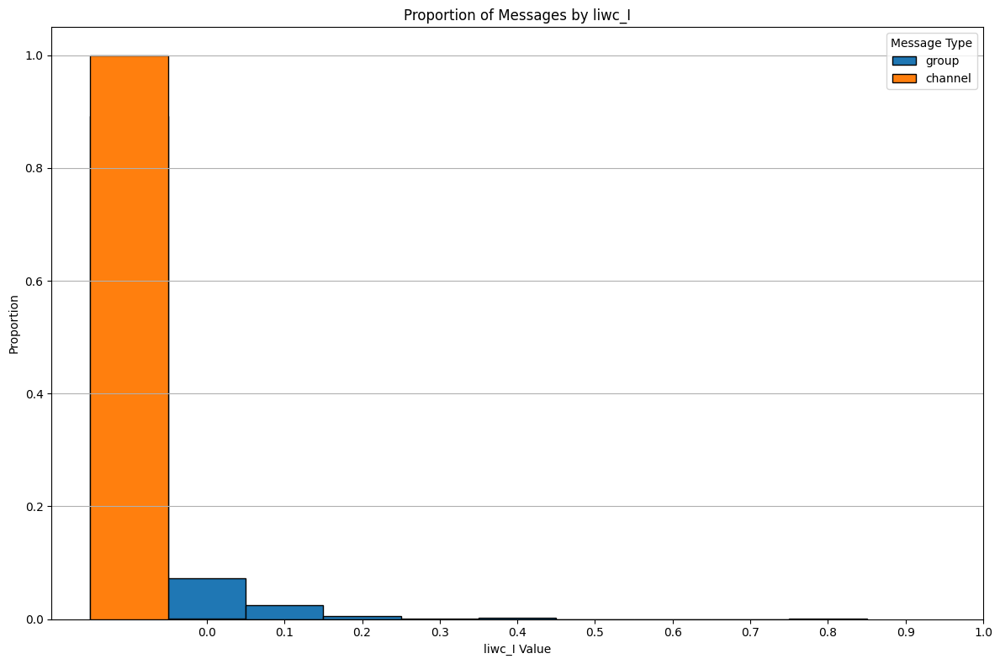

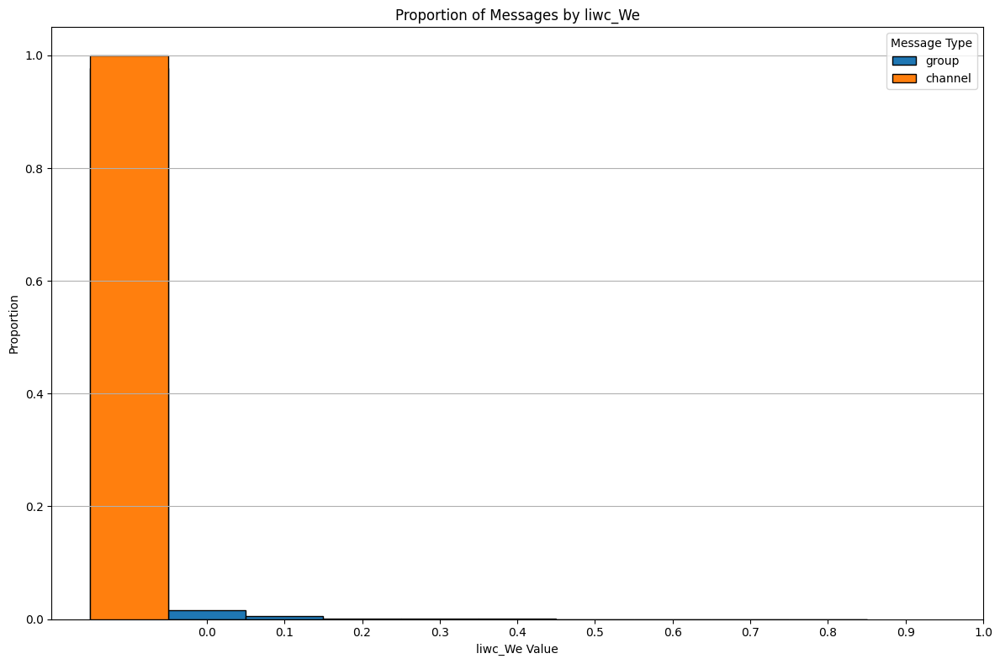

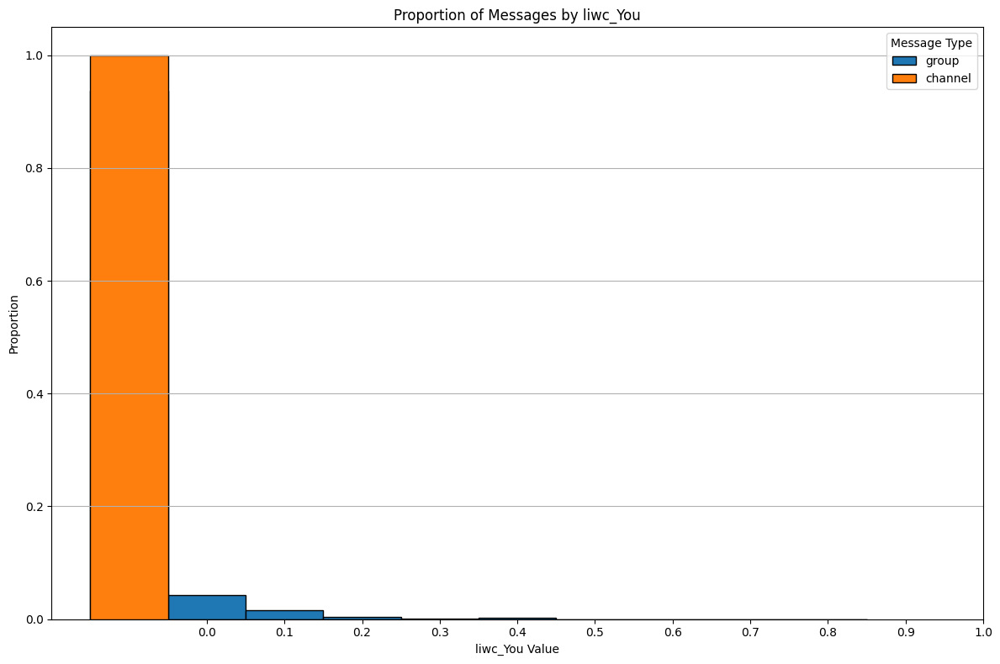

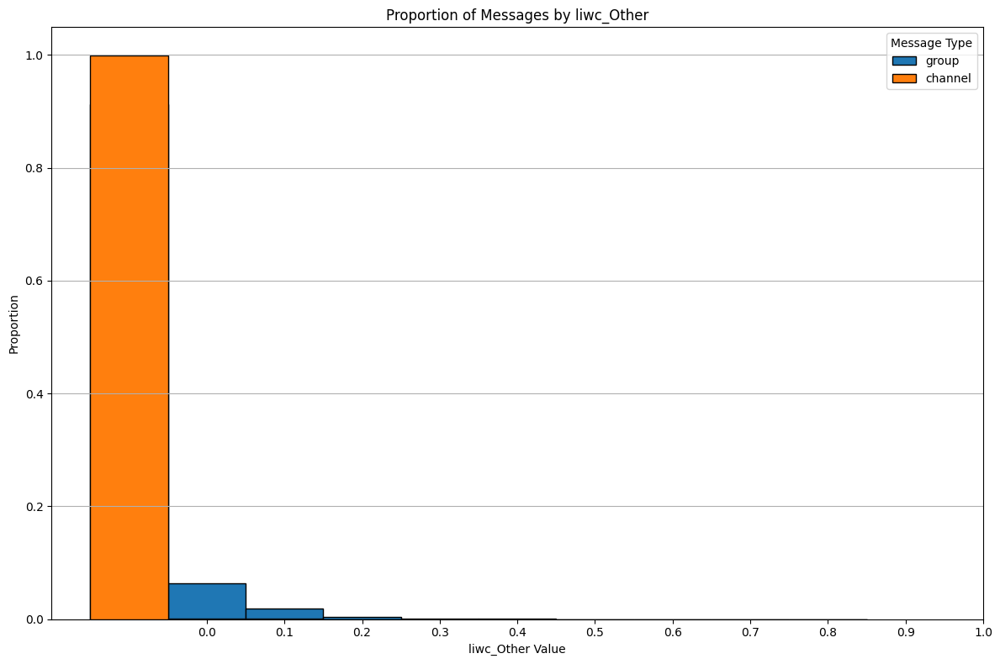

In [21]:
# Plot proportions of LIWC categories differentiated by 'group_or_channel'
for col in ['liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other']:
    plt.figure(figsize=(12, 8))
    
    for group in pre_agg['group_or_channel'].unique():
        # Filter data by 'group_or_channel'
        subset = pre_agg[pre_agg['group_or_channel'] == group]
        
        # Calculate histogram
        counts, bin_edges = np.histogram(subset[col], bins=np.arange(0, 1.1, 0.1))
        
        # Calculate proportions
        proportions = counts / counts.sum()
        
        # Plot histogram
        plt.bar(bin_edges[:-1] + (0.1 if group == 'Channel' else -0.1), proportions, 
                width=0.1, align='center', edgecolor='black', label=group)
    
    plt.title(f'Proportion of Messages by {col}')
    plt.xlabel(f'{col} Value')
    plt.ylabel('Proportion')
    plt.xticks(np.arange(0, 1.1, 0.1))
    plt.legend(title='Message Type')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

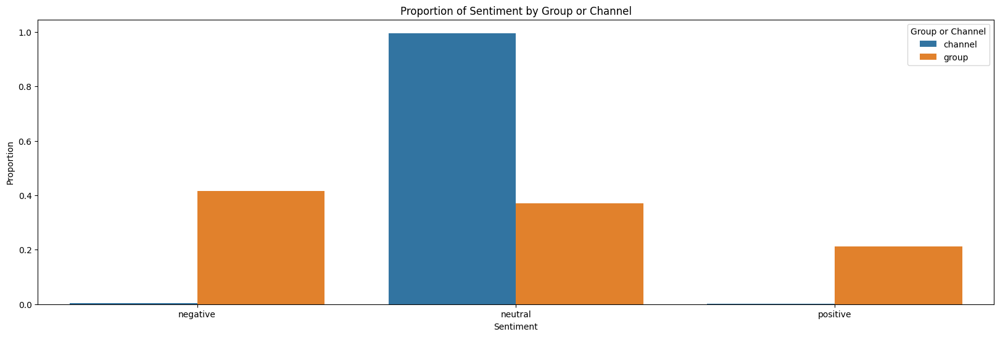

In [22]:
# plot sentiment by group or channel
prop_sent = pre_agg.groupby(['group_or_channel', 'sentiment']).size().reset_index(name='count')
prop_sent['proportion'] = prop_sent.groupby('group_or_channel')['count'].transform(lambda x: x / x.sum())

plt.figure(figsize=(20, 6))
sns.barplot(data=prop_sent, x='sentiment', y='proportion', hue='group_or_channel')
plt.title('Proportion of Sentiment by Group or Channel')
plt.xlabel('Sentiment')
plt.ylabel('Proportion')
plt.legend(title='Group or Channel')
plt.show()

# Own vs.Forwarded Messages

Text(0.5, 1.0, 'Own vs. Forwarded Messages')

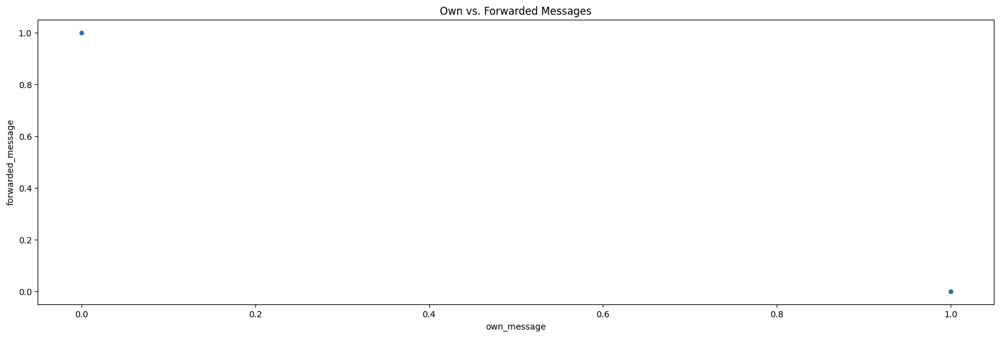

In [24]:
# scatter plot of own vs. forwarded messages
plt.figure(figsize=(20, 6)) 
sns.scatterplot(data=post_agg_author, x='own_message', y='forwarded_message')
plt.title('Own vs. Forwarded Messages')

In [27]:
post_agg_author[(post_agg_author['own_message'] != 0) & (post_agg_author['forwarded_message'] != 0)]

,author,noun_count,verb_count,adj_count,positive_sentiment,negative_sentiment,neutral_sentiment,channel_messages,group_messages,sent_count,...,final_message,final_message_string,own_message,forwarded_message,total_message_count,own_message_count,forwarded_message_count,action_quotient,sentiment_quotient,avg_flesch_reading_ease_class


# LIWC Features

<Figure size 1000x800 with 0 Axes>

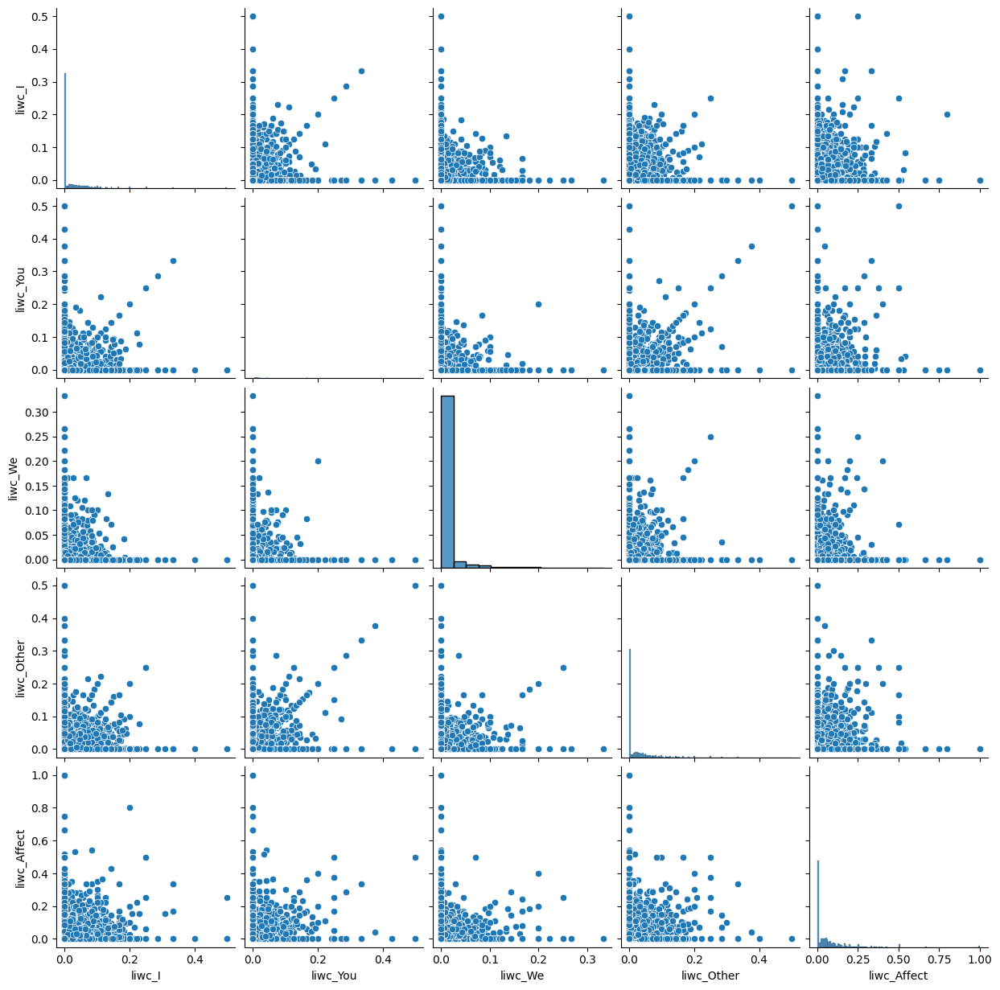

In [21]:
liwc = post_agg_author[['liwc_I', 'liwc_You', 'liwc_We', 'liwc_Other', 'liwc_Affect']]
liwc = liwc.dropna(how='all')

# Plot 
plt.figure(figsize=(10, 8))
sns.pairplot(liwc)

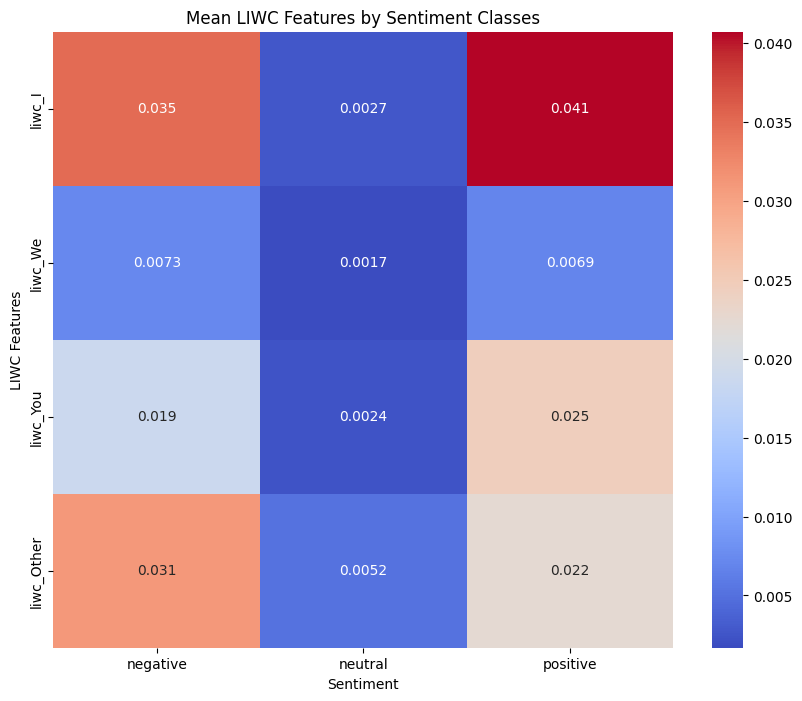

In [22]:
# Calculate the mean of each feature per sentiment class
mean_values = pre_agg[['liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other', 'sentiment']].groupby('sentiment').mean().T

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(mean_values, annot=True, cmap='coolwarm')
plt.title('Mean LIWC Features by Sentiment Classes')
plt.xlabel('Sentiment')
plt.ylabel('LIWC Features')
plt.show()

# PCA

In [25]:
#drop columns that are not features
features = post_agg_author.drop(['author','final_message', 'final_message_string', 'avg_flesch_reading_ease_class'], axis=1)
features = features.fillna(features.mean())

#standardize features
scaler = StandardScaler()
features = scaler.fit_transform(features)

In [26]:
# Find optimal number of components using the Elbow Method
explained_variance = []
num_features = features.shape[1]

for i in range(1, num_features + 1):
    pca = PCA(n_components=i)
    pca.fit(features)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

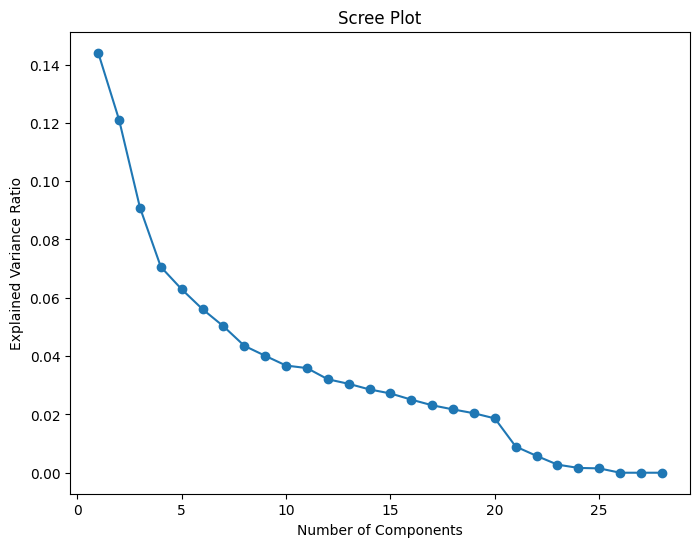

In [27]:
#plot a scree plot instead
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Scree Plot')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.show()

In [28]:
#perform PCA to two components
pca = PCA(n_components=4)
pca_transformed = pca.fit_transform(features)

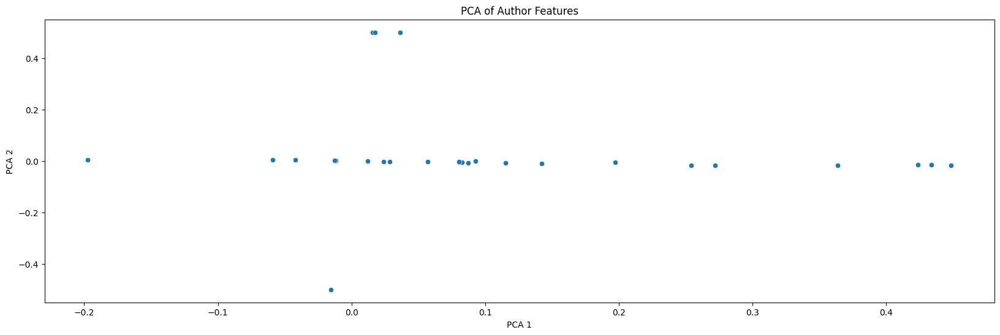

In [29]:
#plot PCA
plt.figure(figsize=(20, 6))
sns.scatterplot(x=pca.components_[0], y=pca.components_[1])
plt.title('PCA of Author Features')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()